In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import itertools
import math

from IPython.display import display

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,MinMaxScaler,RobustScaler
from sklearn.cluster import KMeans,DBSCAN
from sklearn.metrics import silhouette_samples, silhouette_score,davies_bouldin_score
from sklearn.decomposition import PCA
from sklearn.base import TransformerMixin

from features import *

## Pipe Grid

In [2]:
take = lambda n,res: list(map(lambda t: t[n],res))

class pipe_params:
    """helping class to generate grid parameters for a pipe"""

    def __init__(self,pipe):
        self.__params__ = pipe.get_params()

    @staticmethod
    def __is_pipe_params__(pipe):
            return lambda s: any(map(lambda x: f"{x}__" in s , take(0,pipe.get_params()['steps'])))

    @staticmethod
    def pipe_params(pipe):
        p = pipe_params.__is_pipe_params__(pipe)
        return {k:v for (k,v) in pipe.get_params().items() if p(k) }

    @staticmethod
    def __overload_pipe_params__(pipe_params,param_grid):
        return {**pipe_params,**param_grid}

    @staticmethod
    def __gen_grid_params__(param_grid):
        """
        >param_grid={'a':[1,2],'b':[3,4],'c':[7]}
        >gen_grid_params(param_grid)gen_p
        gives:
        [   {'a': 1, 'b': 3, 'c': 7},
            {'a': 1, 'b': 4, 'c': 7},
            {'a': 2, 'b': 3, 'c': 7},
            {'a': 2, 'b': 4, 'c': 7}
        ]
        """
        dict_keys     = lambda d : [k for k in d.keys()]
        dict_prod_len = lambda d : math.prod(map(lambda x: len(x),d.values()))
        return [ {k:v for (k,v) in t}
                for t in [
                        list(zip(x[0],x[1])) for x in 
                            list( zip(
                                    [dict_keys(param_grid)]*dict_prod_len(param_grid),
                                    list(itertools.product(*param_grid.values())),
                                )
                            )
                        ]
        ]

    def make(self,param_grid):
        """Generate grid parameters for pipe based on param_grid"""
        return [
            pipe_params.__overload_pipe_params__(self.__params__,pg)
            for pg in pipe_params.__gen_grid_params__(param_grid)
        ]

class GridSearchPipe:
    def __init__(self,grids,scorings,score,display=None,display_params=None,store_raw_res=True):
        self.__grids__          = grids
        self.__scorings__       = scorings
        self.__score__          = score
        self.__res__            = {} 
        self.__store_raw_res__  = store_raw_res
        self.__display__        = display
        self.__display_params__ = display_params
        if store_raw_res == True:
            self.__raw_res__  = {}

    def __select_best__(self,results):
        return max(results,key=lambda d: d[self.__score__])

    def best_pipe(self):
        pass

    def fit_predict(self,X):
        """
            fit all models set in the Grid search with X and predict cluster
            Also compute score.
        """
        values = lambda params,fitted_params : [ v for fitted_params in fitted_params for (k,v) in params.items() if k ==  fitted_params ]
        title = lambda id,params,fitted_params: f"{id}: {', '.join(map(lambda t: f'{t[0]}: {t[1]}',zip(fitted_params,values(params,fitted_params))))}"
        for grid_id_ in self.__grids__.keys():
            grid = self.__grids__[grid_id_]
            pipe_ = grid['pipe']
            results = []
            for params in pipe_params(pipe_).make(grid['params']):
                try:
                    res_ = {}
                    res_['params'] = params
                    #set params
                    pipe_.set_params(**params)
                    #compute clusters 
                    res_['cluster_labels']  = pipe_.fit_predict(X)
                    #compute scores
                    if(len(pipe_.steps) >= 2):
                        X_trans = pipe_[:-1].transform(X)
                    else:
                        X_trans = X
                    for (k,score) in self.__scorings__.items():
                            res_[k]  = score(X_trans,res_['cluster_labels'])

                    results.append(res_)

                    if(self.__display__ is not None):
                        display_params_ = self.__display_params__ if grid.get('display_params') is None else {**self.__display_params__,**grid['display_params']} 
                        self.__display__(res_,X,title(grid_id_,params,grid['fitted_params']),**display_params_)

                except Exception as e:
                    print(f"Exception for {grid_id_} (params: {params}): exception ({e})\n")
                    continue

            #self.__res__[grid_id_] = self.__select_best__(results)
            if self.__store_raw_res__ == True:
                self.__raw_res__[grid_id_] = results


## Transformers

### Feature Selection

In [11]:
#class RuleSelection(TransformerMixin):
#    """
#        Transformer for selection of features based on a rule using sklearn style transform method.  
#    """
#
#    def __init__(self,rule=None):
#        self.__rule__ = rule
#        pass
#
#    def fit(self, X, y=None):
#        return self
#
#    def transform(self, X):
#        if type(X) == pd.DataFrame:
#            features = self.__rule__(X)
#            return X.loc[:,features]
#        else:
#            return X
#
#class FeaturesSelection(TransformerMixin):
#    """
#        Transformer for manual selection of features using sklearn style transform method.  
#    """
#
#    def __init__(self,features=None):
#        self.__features__ = features
#        pass
#
#    def fit(self, X, y=None):
#        return self
# 
#    def set_params(self,features):
#        self.__features__ = features
#
#    def transform(self, X):
#        if type(X) == pd.DataFrame:
#            columns = X.columns.values
#            features = list(filter(lambda x: x in columns ,self.__features__))
#            return X.loc[:,features]
#        else:
#            return X
#
#class FeaturesScaler(TransformerMixin):
#    """
#        Transformer for scaling features using sklearn style transform method.  
#    """
#
#    def __init__(self,scaler=None):
#        self.__scaler__ = scaler
#        pass
#
#    def fit(self, X, y=None):
#        return self
# 
#    def set_params(self,scaler):
#        self.__scaler__ = scaler
#
#    def transform(self, X):
#        if type(X) == pd.DataFrame:
#            X_scaled = self.__scaler__.fit_transform(X)
#            return pd.DataFrame(X_scaled,columns=X.columns)
#        else:
#            return self.__scaler__.fit_transform(X)
#
#class LambdaFeatures(TransformerMixin):
#    def __init__(self,f=None,features=None):
#        self.__f__ = f
#        self.__features__ = features 
#        pass
#
#    def set_params(self,f):
#        self.__f__ = f
#
#    def fit(self, X, y=None):
#        return self
# 
#    def transform(self, X):
#        if self.__features__ is None:
#            return self.__f__(X)
#        else:
#            for c in self.__features__:
#                if c in X.columns.values:
#                    X[c] = self.__f__(X[c])
#            return X
#
#class Id:
#    def __call__(self, *args):
#        return args[0]
#    def __repr__(self):
#        return "Id"
#
#class Log_plus1:
#    def __call__(self, *args):
#        return np.log(args[0]+1)
#    def __repr__(self):
#        return "Log_plus1"

### PCAFeaturesSelection

In [12]:
#class PCAFeaturesSelection(TransformerMixin):
#    """
#    Transformer for manual selection of features using sklearn style transform method.  
#    """
#
#    def __init__(self,level=0.8):
#        self.__level__ = level
#        self.__pipe__  = Pipeline([("1",StandardScaler()),("2",PCA())])
#        self.__range__ = None
#        pass
#
#    def set_params(self,level):
#        self.__level__ = level
#
#    def __range_components__(self):
#        total = 0
#        def below(x):
#            nonlocal total 
#            total = total+x
#            return (total < self.__level__)
#        self.__range__ = range(len(list(itertools.takewhile(below,self.__pipe__ [-1].explained_variance_ratio_) )))
#
#    def fit(self, X, y=None):
#        self.__pipe__.fit(X)
#        self.__range_components__()
#        return self
# 
#    def transform(self, X,y=None):
#        X_trans = self.__pipe__.transform(X)
#        return X_trans[:,self.__range__]


## Display helping functions

In [6]:
def display_silhouette_values(ax,sample_silhouette_values,cluster_labels,silhouette_avg,title):

    n_clusters = np.ma.count((np.unique(cluster_labels)))

    # The silhouette coefficient can range from -1, 1 
    ax.set_xlim([-1, 1])

    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    y_lower = 20
    ax.set_ylim([0, len(sample_silhouette_values) + (n_clusters + 1) * y_lower])

    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    # The vertical line for average silhouette score of all the values
    ax.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax.set_yticks([])  # Clear the yaxis labels / ticks
    ax.set_xticks(np.arange(-1,1.1,0.2))
    
    ax.set_title(title)
    ax.set_xlabel("The silhouette coefficient values")
    ax.set_ylabel("Cluster label")

def display_clustering(ax,X,centers,cluster_labels,title):
    
    n_clusters = np.ma.count((np.unique(cluster_labels)))

    # 2nd Plot showing the actual clusters formed
    cs = cluster_labels[~cluster_labels.mask].astype(float)
    n = cs.shape[0]
    if n == 1: 
        cs = cs[0] / n_clusters
    else:
        cs = cs / n_clusters
    colors = cm.nipy_spectral(cs)
    ax.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    # Draw white circles at cluster centers
    ax.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax.set_title(title)
    ax.set_xlabel("1st component")
    ax.set_ylabel("2nd component")

def compute_centers(X,labels):
    center = lambda X,clusters,label: X.iloc[np.where(clusters == label)[0],:].mean(numeric_only=True)
    return pd.DataFrame(data=[center(X,labels,label) for label in range(np.ma.count(np.unique(labels)))],columns=X.columns)

def compute_clusters_pops(X,labels):
    pops = {label:[len(X.iloc[np.where(labels == label)[0],:])] for label in np.unique(labels)}
    return pd.DataFrame(pops)

def display_cluster(grid,X,name,fig_size=(25,12),pipe=None,cluster_title="Cluster Plot in PCA space"):

    labels = grid['cluster_labels']
    # compute clusters population
    pops = compute_clusters_pops(X,labels)

    # filtered out unassigned points (i.e label == -1)
    labels_ = np.ma.masked_equal(labels,-1,copy=False)
    X_ = X.iloc[np.where(labels != -1)[0],:]

    # create figure
    fig,(ax1,ax2) = plt.subplots(1, 2)
    fig.set_size_inches(*fig_size)
    
    # display silhouette samples
    display_silhouette_values(ax1,grid['silhouette_samples'],labels_,grid['silhouette_score'],f"The silhouette plot")

    # display clusters
    centers = compute_centers(X,labels_)
    if pipe is not None:
        pipe.fit(X)    
        X_ = pipe.transform(X_)
        centers = pipe.transform(centers)

    display_clustering(ax2,X_,centers,labels_,cluster_title)
    
    print("====>")
    print(f"Clusters population for {name}")
    display(pops)
    fig.suptitle(name)
    plt.show()

def display_best(grid_search,X):
    results = grid_search.__res__
    for grid_id in results.keys():
        display_cluster(results[grid_id],X,grid_id)

## Load data set

In [3]:
data = pd.read_csv('./data/dfs/results/full.csv',index_col='c_customer_unique_id')

## Clustering main

In [4]:
def davies_bouldin_scorer(X,labels):
    return -1*davies_bouldin_score(X,labels)
scores = {'silhouette_score':silhouette_score,'davies_bouldin_score':davies_bouldin_scorer,'silhouette_samples':silhouette_samples}
types = data.dtypes
columns = types[types == 'float64'].index.values
display_pipe = Pipeline([("1",FeaturesSelection(columns)),("2",StandardScaler()),("3",PCA())])

def do_clustering(config,X):
    grid_search = GridSearchPipe(config,scores,score='silhouette_score',display=display_cluster,display_params={'pipe':display_pipe})
    grid_search.fit_predict(X)
    return grid_search

## Configuration

====>
Clusters population for RFM-kmeans: k-means__n_clusters: 2


,0,1
0,51493,38955


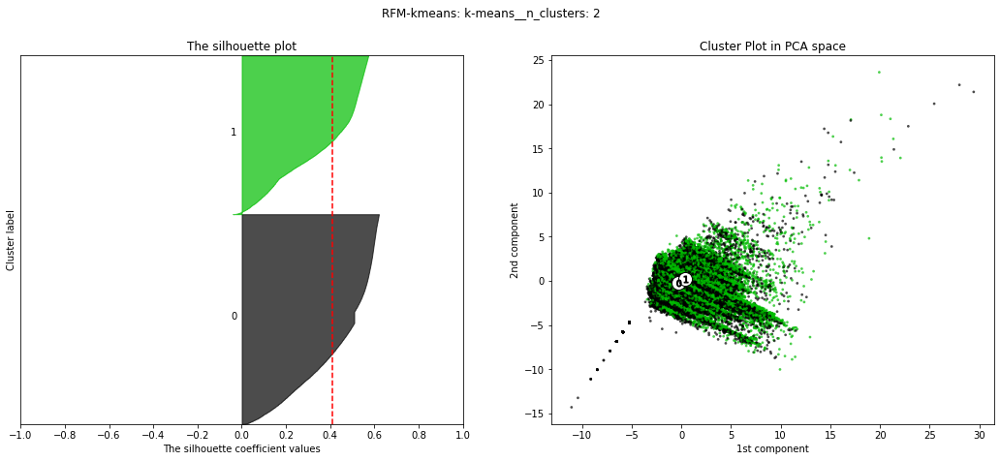

====>
Clusters population for RFM-kmeans: k-means__n_clusters: 3


,0,1,2
0,46150,34811,9487


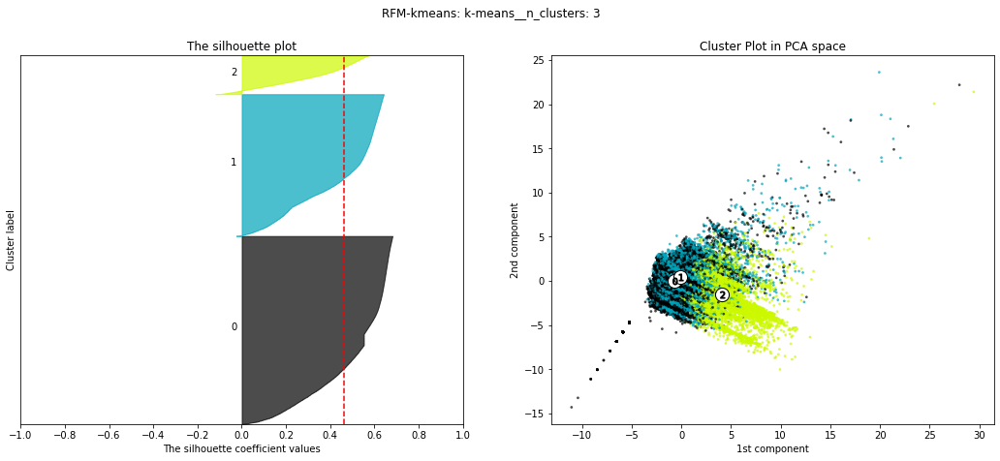

====>
Clusters population for RFM-kmeans: k-means__n_clusters: 4


,0,1,2,3
0,29275,31619,20455,9099


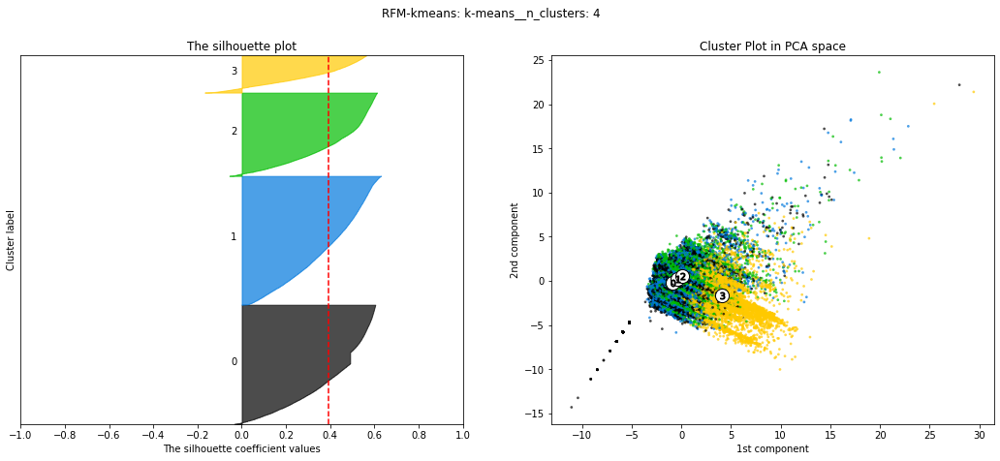

====>
Clusters population for RFM-kmeans: k-means__n_clusters: 5


,0,1,2,3,4
0,28236,26003,11314,20098,4797


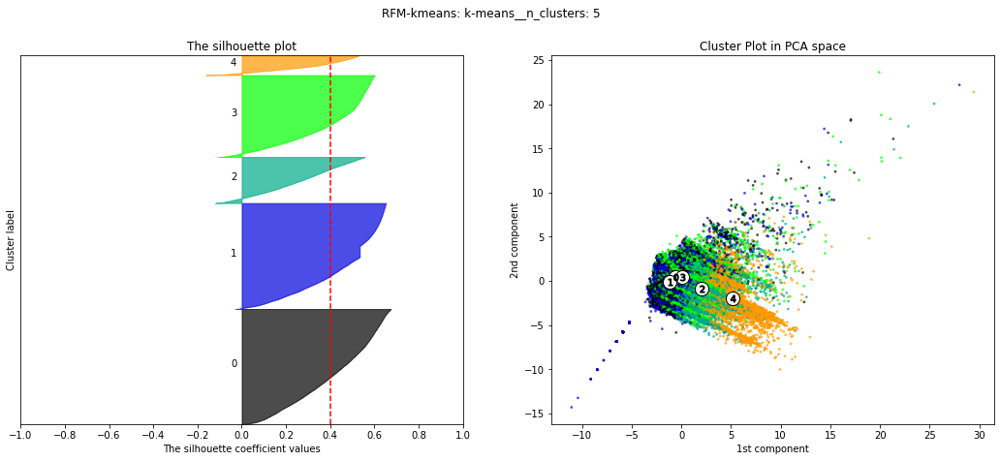

====>
Clusters population for RFM-kmeans: k-means__n_clusters: 6


,0,1,2,3,4,5
0,11030,17176,23600,4161,28063,6418


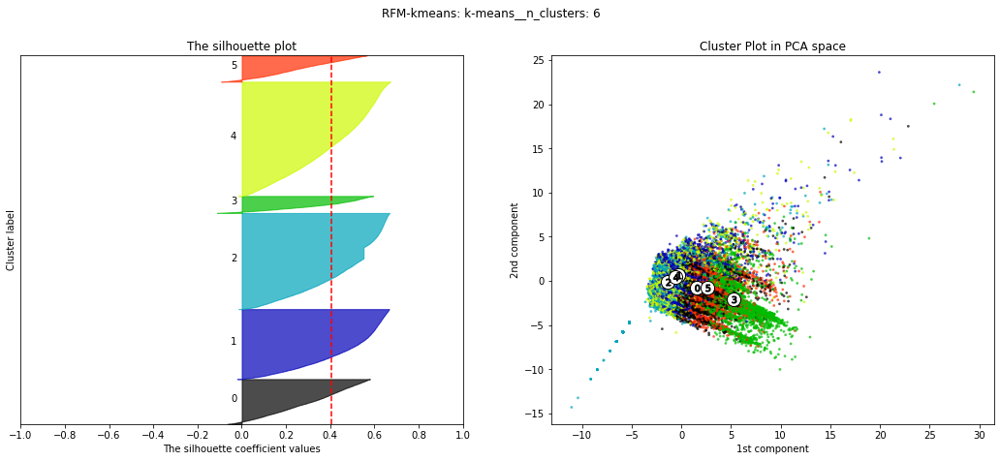

====>
Clusters population for RFM-kmeans: k-means__n_clusters: 7


,0,1,2,3,4,5,6
0,16279,19288,3891,13427,9628,5763,22172


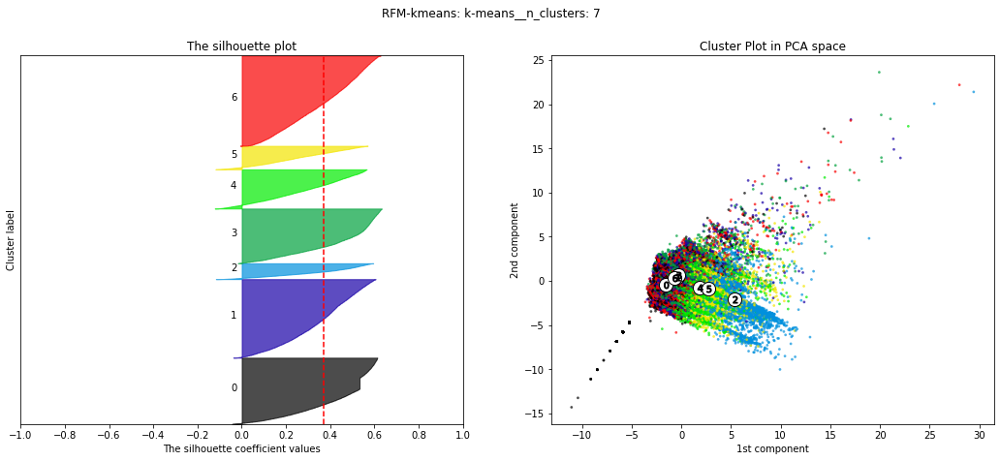

====>
Clusters population for RFM-kmeans: k-means__n_clusters: 8


,0,1,2,3,4,5,6,7
0,13218,14542,11595,2616,19087,5902,4331,19157


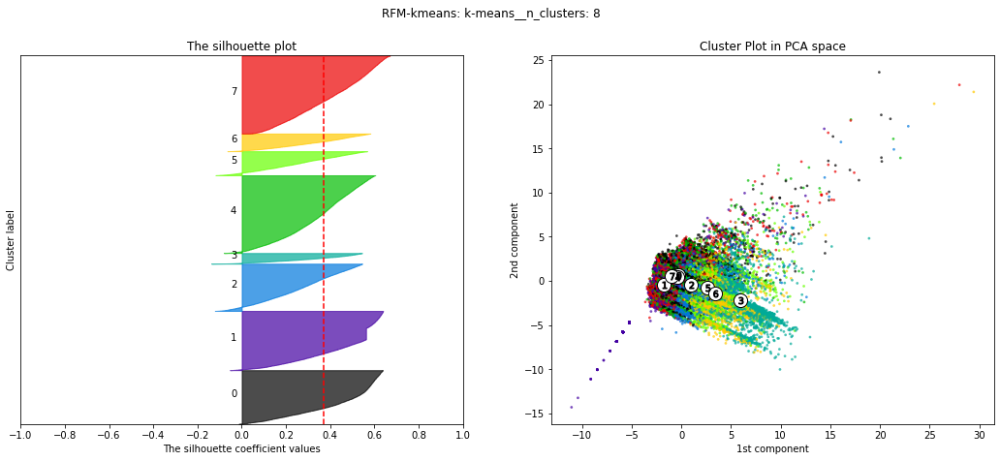

====>
Clusters population for RFM-kmeans: k-means__n_clusters: 9


,0,1,2,3,4,5,6,7,8
0,12614,12352,2577,10461,4538,8840,3964,16021,19081


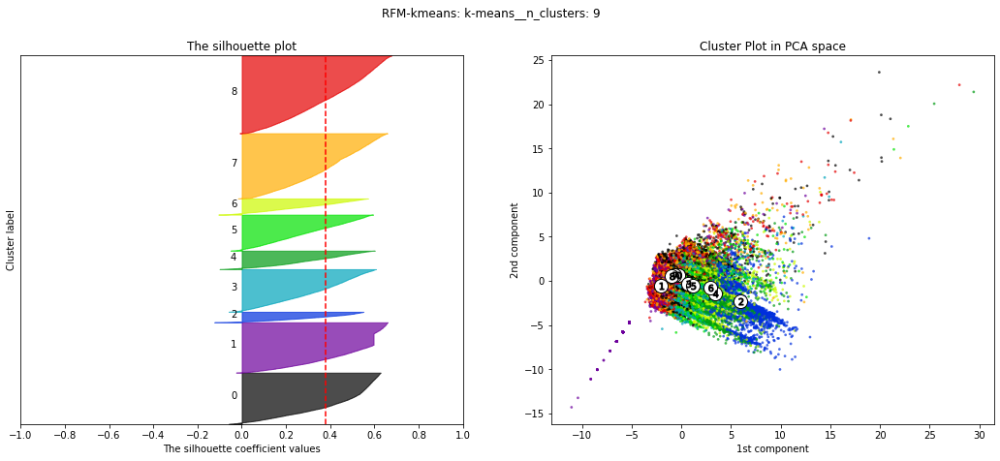

====>
Clusters population for RFM-kmeans: k-means__n_clusters: 10


,0,1,2,3,4,5,6,7,8,9
0,8858,9369,15757,3833,11718,2535,11305,4375,8501,14197


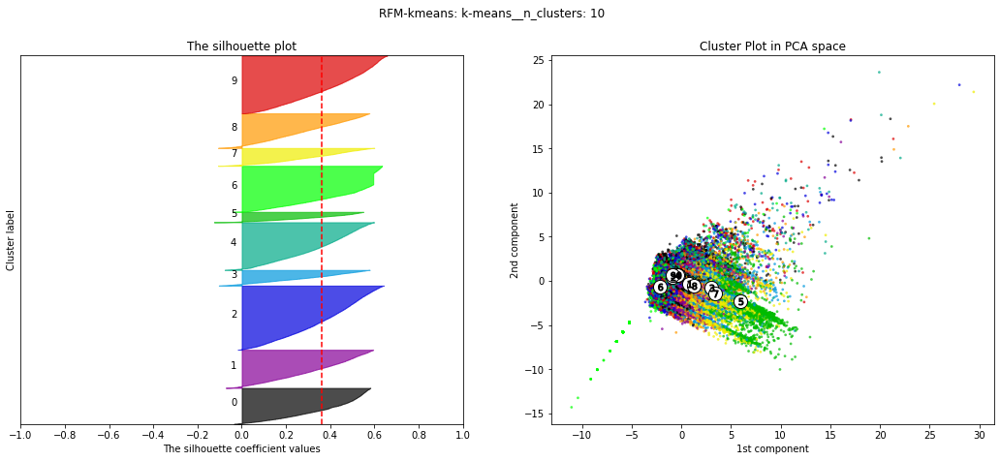

====>
Clusters population for RFM-kmeans: k-means__n_clusters: 11


,0,1,2,3,4,5,6,7,8,9,10
0,8746,8717,9334,1957,11397,4264,15287,4551,1687,10852,13656


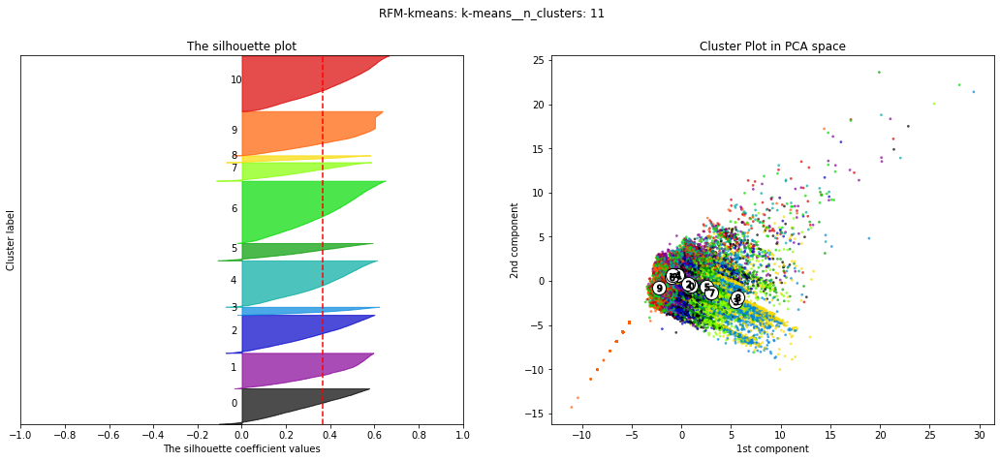

====>
Clusters population for RFM-kmeans: k-means__n_clusters: 12


,0,1,2,3,4,5,6,7,8,9,10,11
0,3599,13106,8289,10436,2273,4065,14656,3197,11229,1352,9350,8896


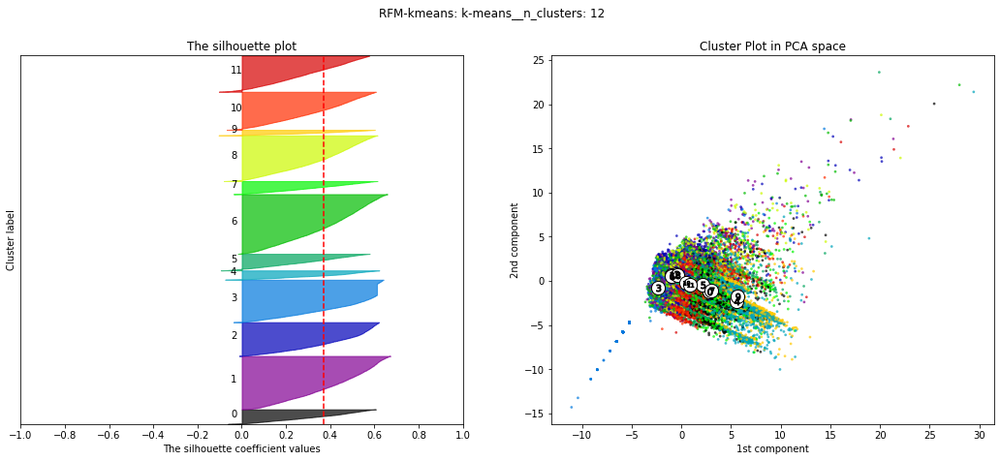

====>
Clusters population for RFM-kmeans: k-means__n_clusters: 13


,0,1,2,3,4,5,6,7,8,9,10,11,12
0,14426,8557,8152,1303,3434,2805,3929,10978,12575,2997,8208,2194,10890


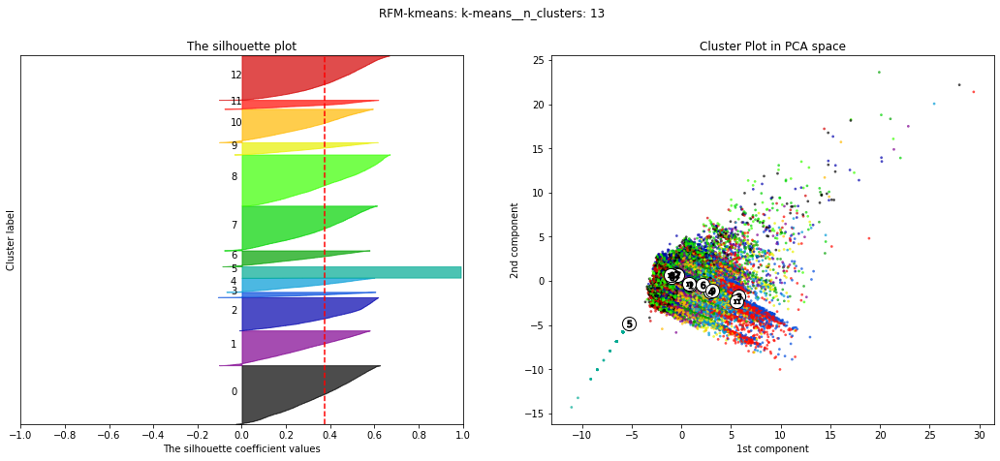

====>
Clusters population for RFM-kmeans: k-means__n_clusters: 14


,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,7415,10193,7654,2143,12895,1307,3163,6066,2790,9965,3458,13410,6774,3215


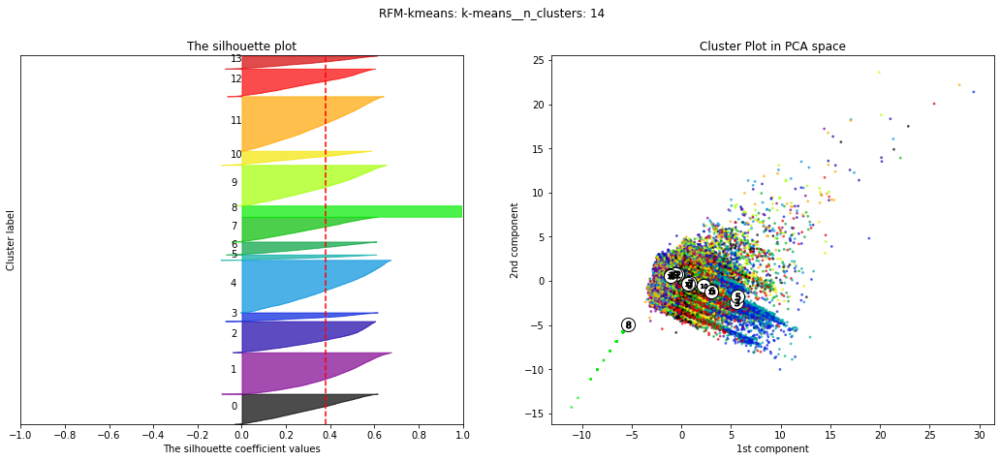

====>
Clusters population for RFM-DBSCAN: dbscan__eps: 0.1, dbscan__min_samples: 5


,-1,0,1,2,3,4,5,6,7,8,...,119,120,121,122,123,124,125,126,127,128
0,1902,75465,8412,32,2746,168,5,61,4,42,...,4,5,5,5,5,5,6,5,5,5


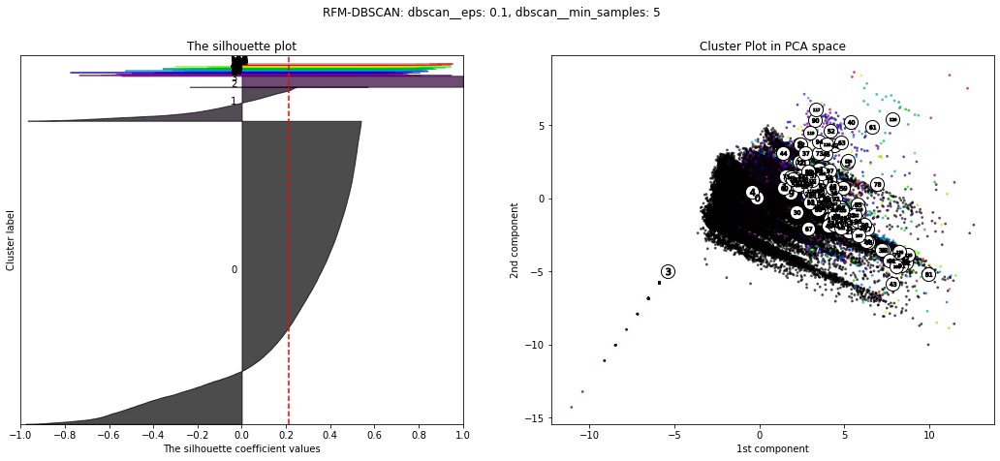

====>
Clusters population for RFM-DBSCAN: dbscan__eps: 0.1, dbscan__min_samples: 10


,-1,0,1,2,3,4,5,6,7,8,...,53,54,55,56,57,58,59,60,61,62
0,3743,74695,8046,2746,159,55,47,15,20,13,...,6,5,8,11,8,9,10,10,10,10


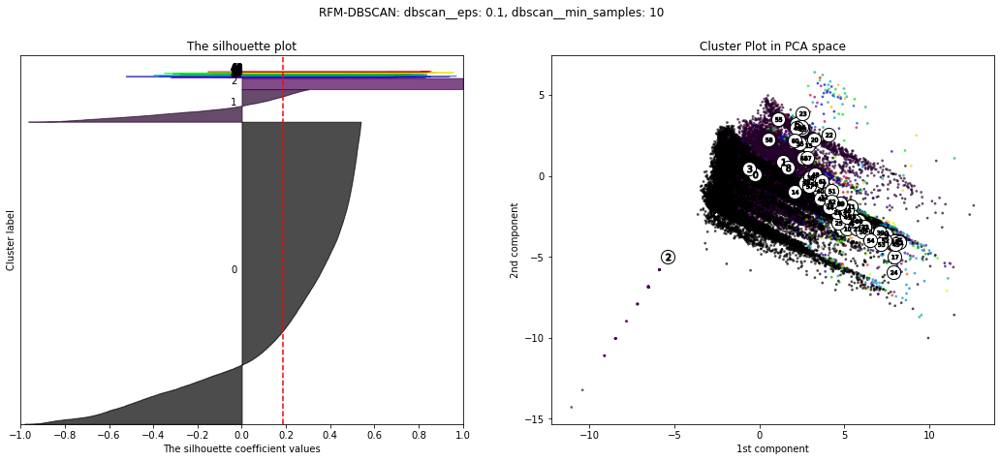

====>
Clusters population for RFM-DBSCAN: dbscan__eps: 0.1, dbscan__min_samples: 50


,-1,0,1,2,3,4,5,6,7,8,9,10
0,15617,71264,2746,83,187,111,116,72,50,90,62,50


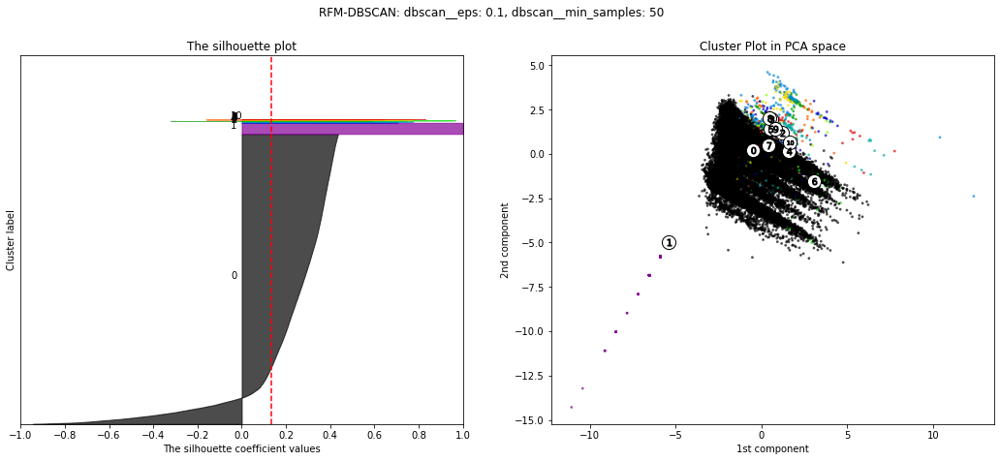

====>
Clusters population for RFM-DBSCAN: dbscan__eps: 0.2, dbscan__min_samples: 5


,-1,0,1,2,3,4,5,6,7,8,...,26,27,28,29,30,31,32,33,34,35
0,549,75786,9251,2746,193,1391,6,283,30,10,...,6,5,6,5,7,5,5,5,4,5


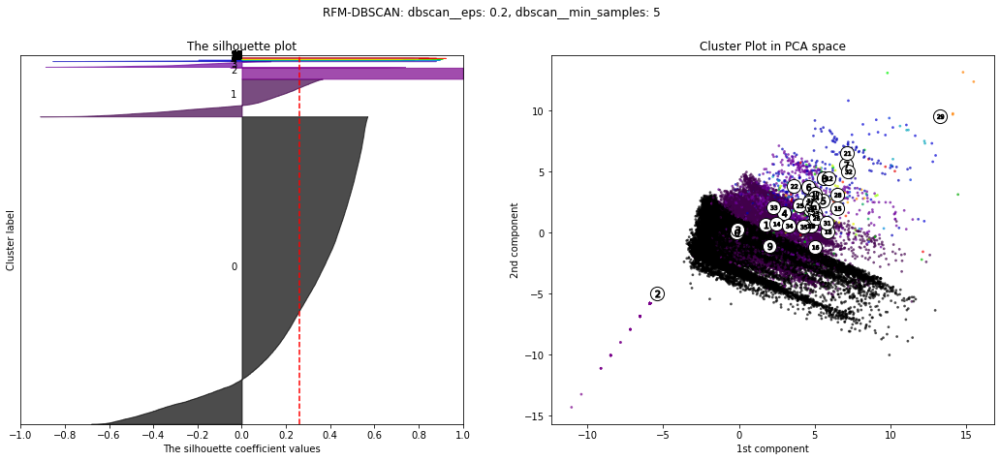

====>
Clusters population for RFM-DBSCAN: dbscan__eps: 0.2, dbscan__min_samples: 10


,-1,0,1,2,3,4,5,6,7,8,...,15,16,17,18,19,20,21,22,23,24
0,1130,75782,9219,2746,170,28,712,18,82,254,...,13,10,24,15,15,10,10,9,10,9


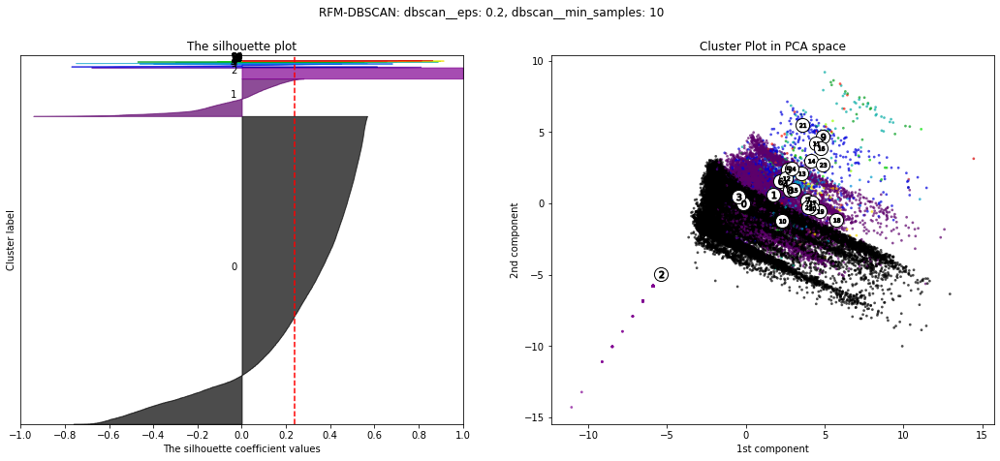

====>
Clusters population for RFM-DBSCAN: dbscan__eps: 0.2, dbscan__min_samples: 50


,-1,0,1,2,3,4,5
0,4941,74528,7845,2746,203,134,51


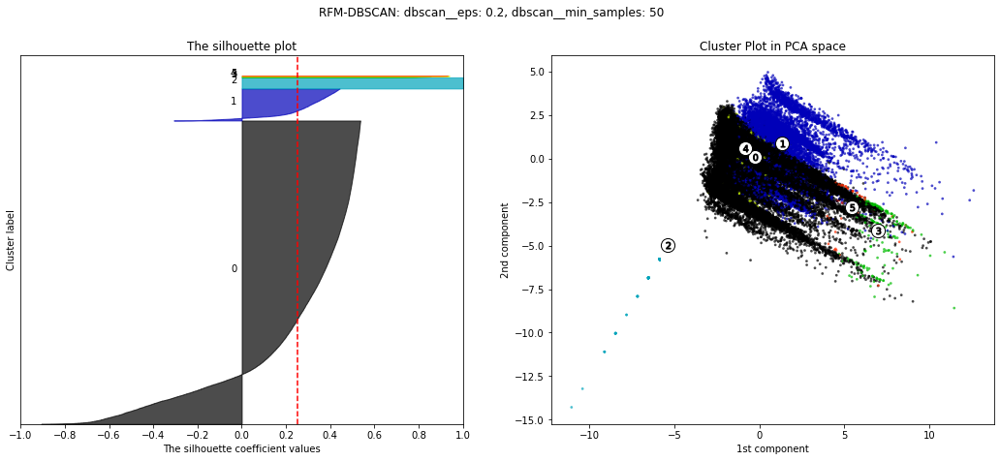

====>
Clusters population for RFM-DBSCAN: dbscan__eps: 0.5, dbscan__min_samples: 5


,-1,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,132,75786,9266,2746,198,587,1484,54,104,21,7,8,8,13,5,8,6,5,4,6


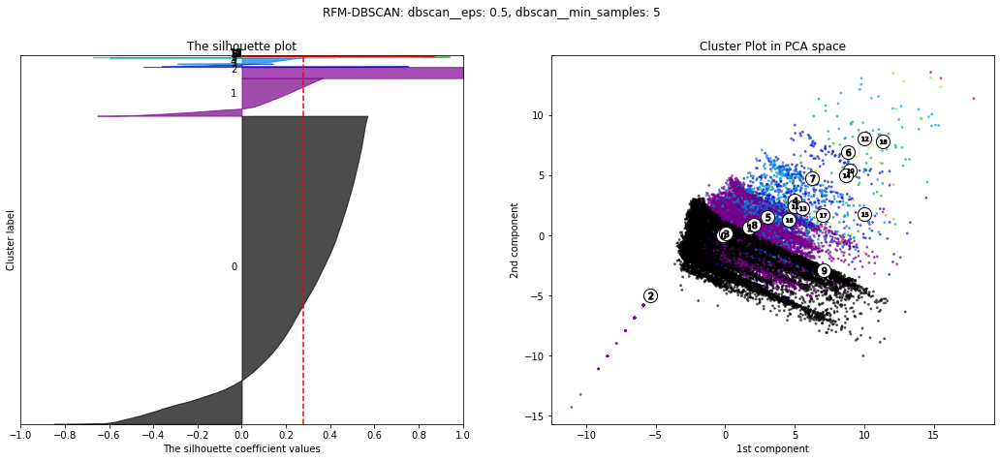

====>
Clusters population for RFM-DBSCAN: dbscan__eps: 0.5, dbscan__min_samples: 10


,-1,0,1,2,3,4,5,6,7,8,9,10,11
0,227,75786,9266,2746,195,581,1484,91,21,23,10,7,11


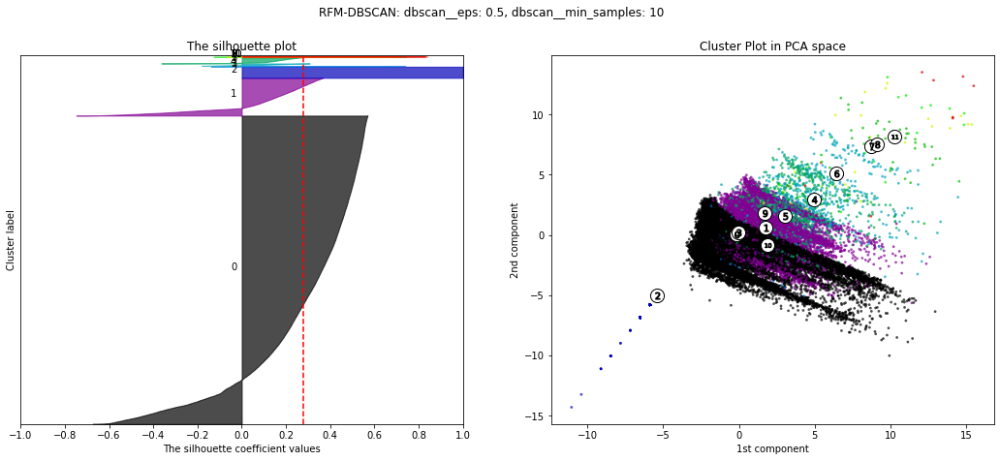

====>
Clusters population for RFM-DBSCAN: dbscan__eps: 0.5, dbscan__min_samples: 50


,-1,0,1,2,3,4,5
0,991,75786,9252,2746,170,1304,199


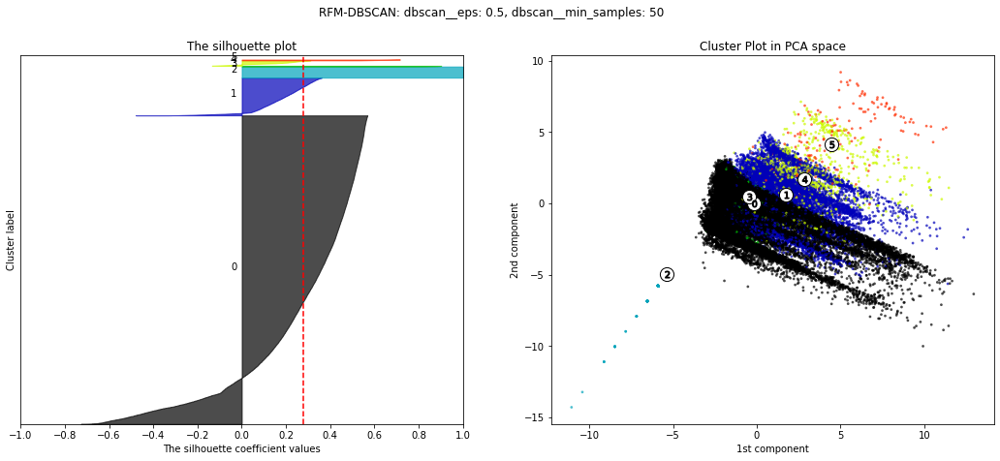

====>
Clusters population for kmeans: k-means__n_clusters: 2, pcaFeaturesSelection__level: 0.75


,0,1
0,72062,18386


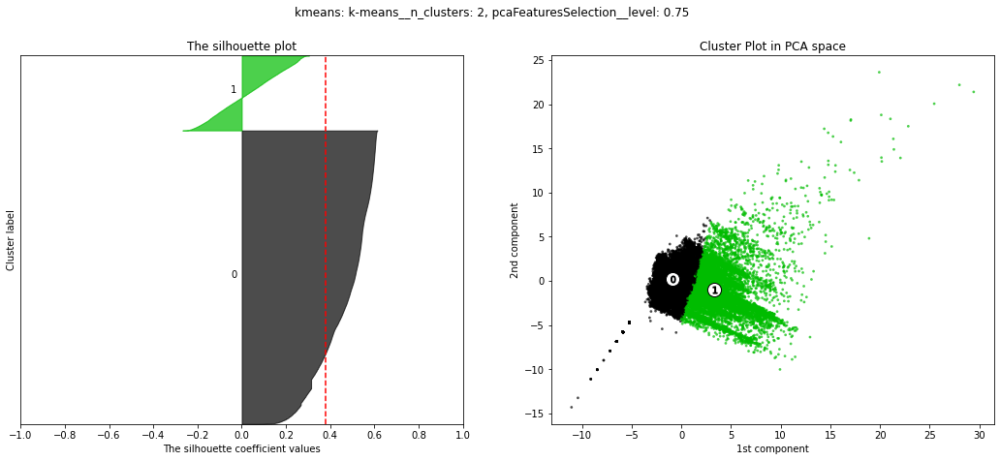

====>
Clusters population for kmeans: k-means__n_clusters: 2, pcaFeaturesSelection__level: 0.8


,0,1
0,72105,18343


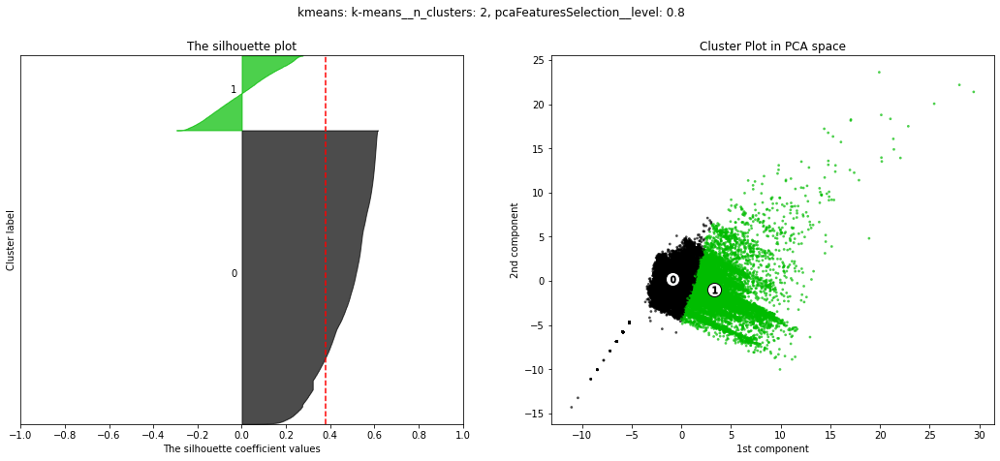

====>
Clusters population for kmeans: k-means__n_clusters: 2, pcaFeaturesSelection__level: 0.85


,0,1
0,18148,72300


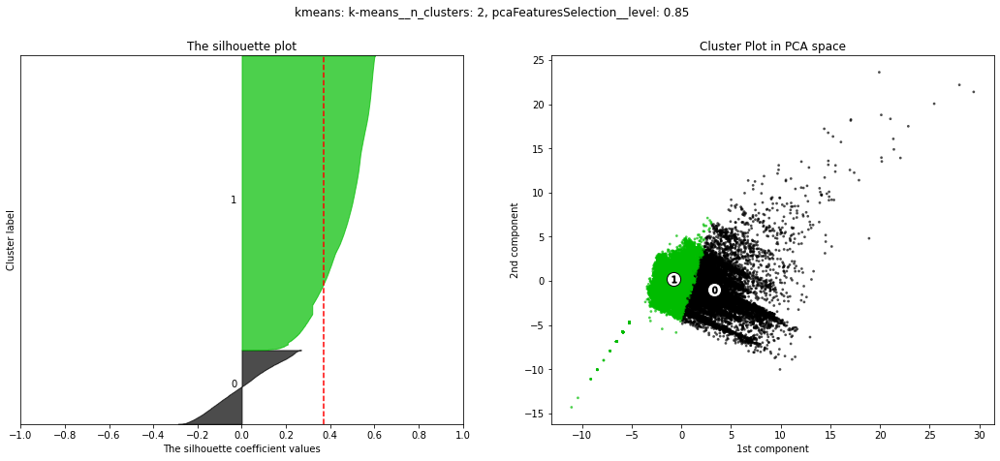

====>
Clusters population for kmeans: k-means__n_clusters: 2, pcaFeaturesSelection__level: 0.9


,0,1
0,72361,18087


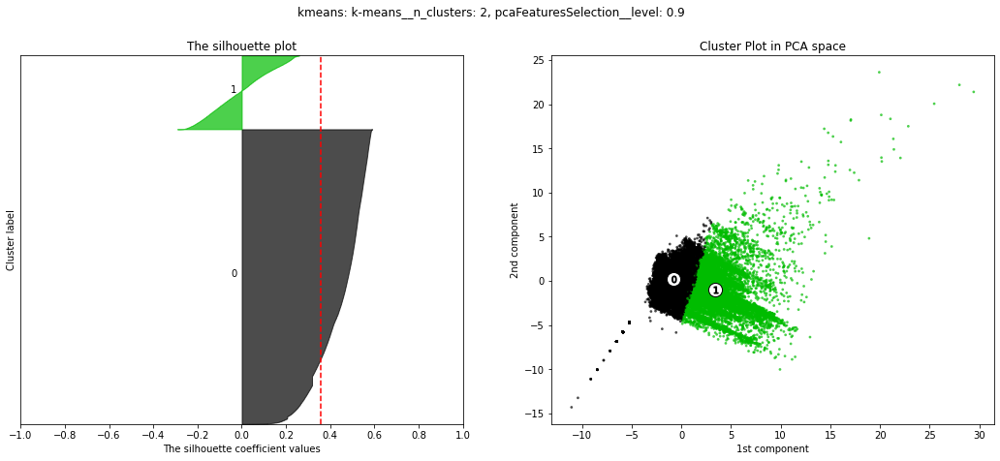

====>
Clusters population for kmeans: k-means__n_clusters: 3, pcaFeaturesSelection__level: 0.75


,0,1,2
0,12024,63749,14675


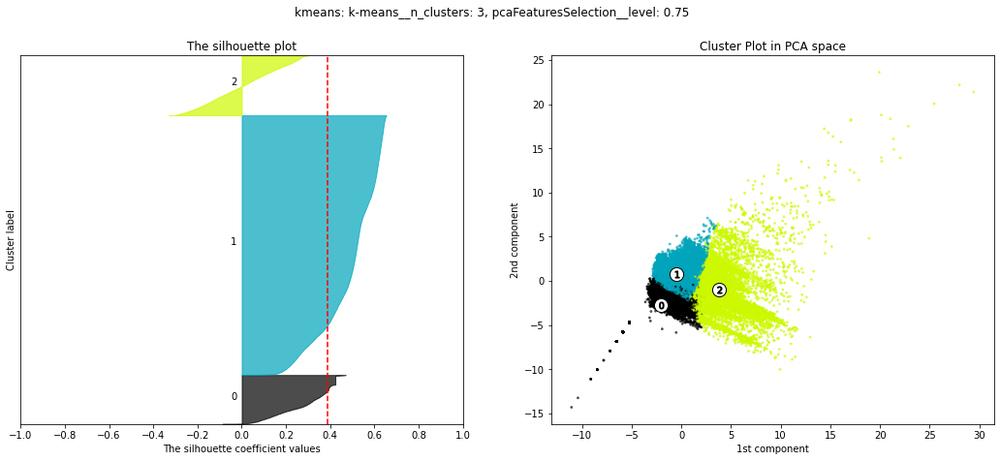

====>
Clusters population for kmeans: k-means__n_clusters: 3, pcaFeaturesSelection__level: 0.8


,0,1,2
0,14592,63822,12034


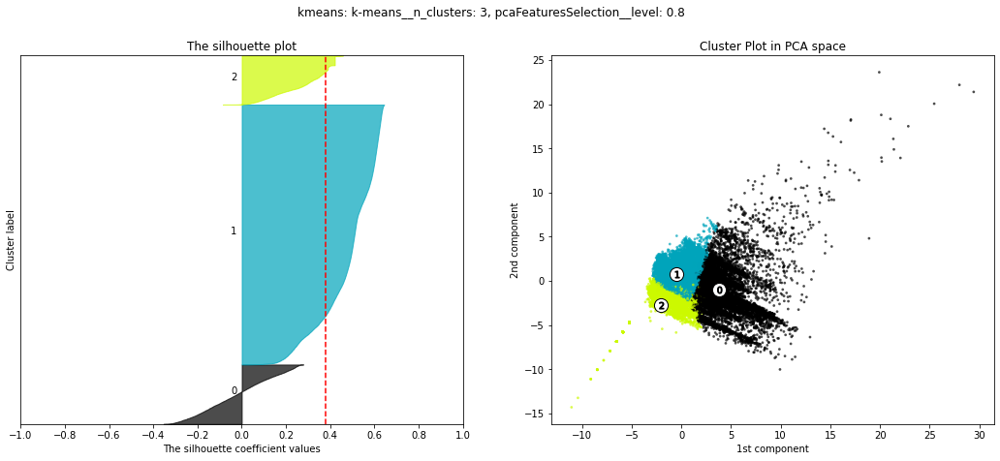

====>
Clusters population for kmeans: k-means__n_clusters: 3, pcaFeaturesSelection__level: 0.85


,0,1,2
0,12090,63955,14403


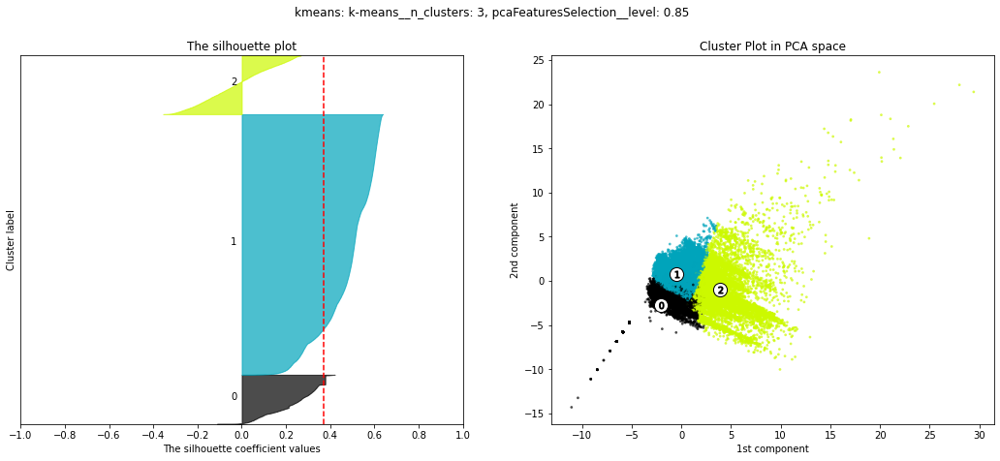

====>
Clusters population for kmeans: k-means__n_clusters: 3, pcaFeaturesSelection__level: 0.9


,0,1,2
0,63924,14454,12070


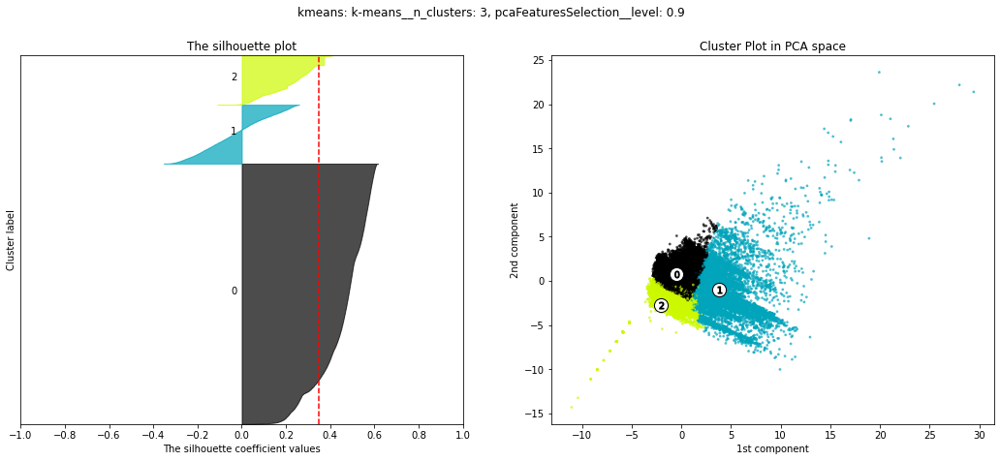

====>
Clusters population for kmeans: k-means__n_clusters: 4, pcaFeaturesSelection__level: 0.75


,0,1,2,3
0,3841,13121,61583,11903


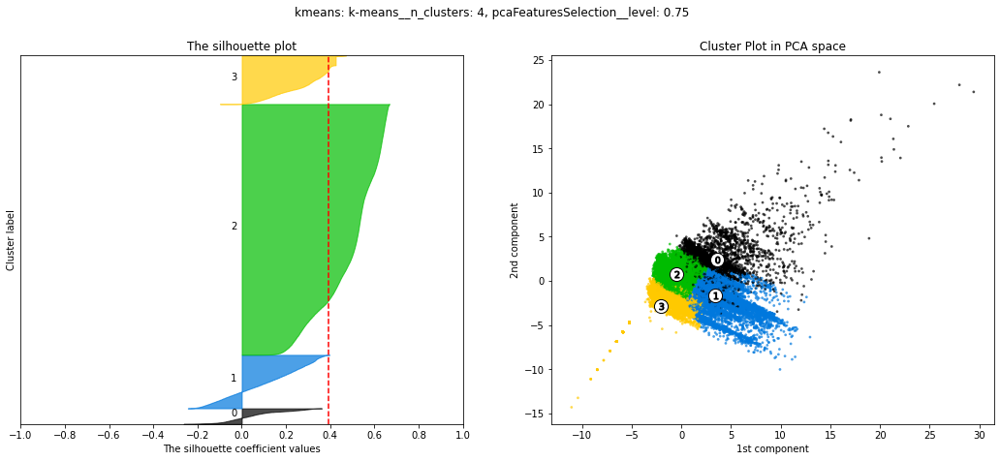

====>
Clusters population for kmeans: k-means__n_clusters: 4, pcaFeaturesSelection__level: 0.8


,0,1,2,3
0,61589,3758,13200,11901


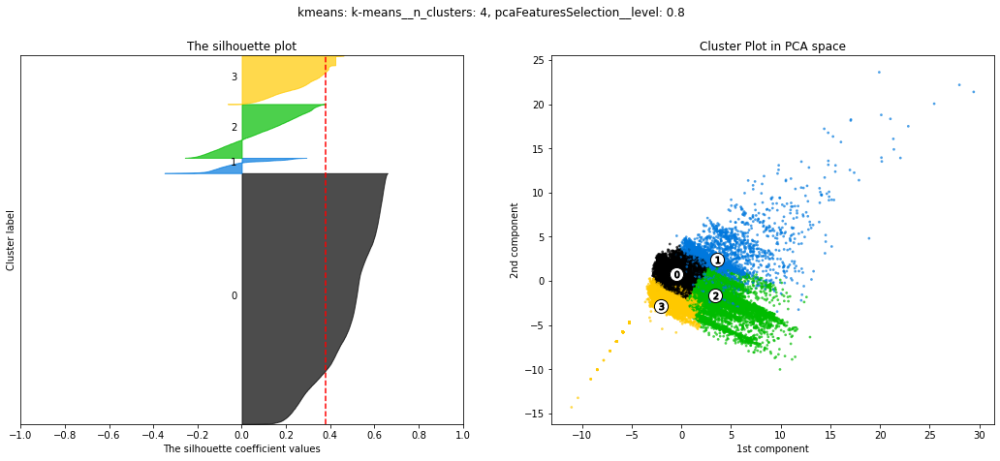

====>
Clusters population for kmeans: k-means__n_clusters: 4, pcaFeaturesSelection__level: 0.85


,0,1,2,3
0,13038,61567,3921,11922


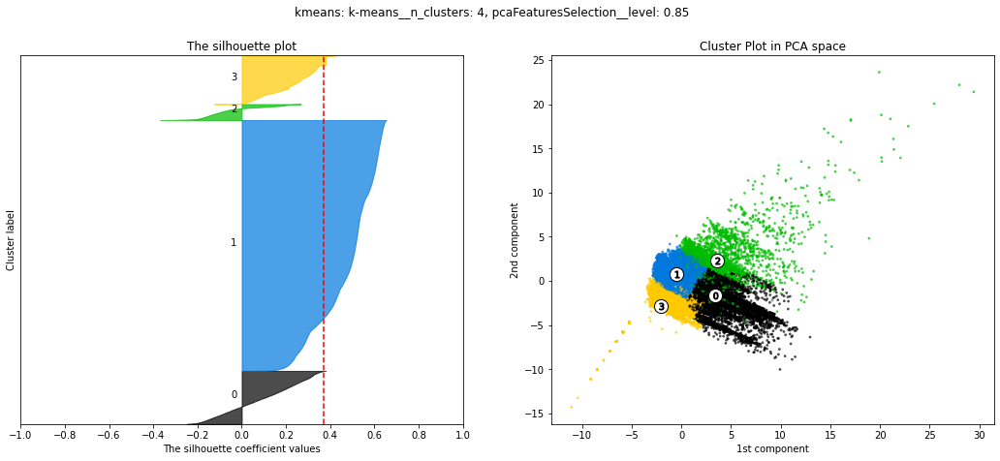

====>
Clusters population for kmeans: k-means__n_clusters: 4, pcaFeaturesSelection__level: 0.9


,0,1,2,3
0,12990,11918,61626,3914


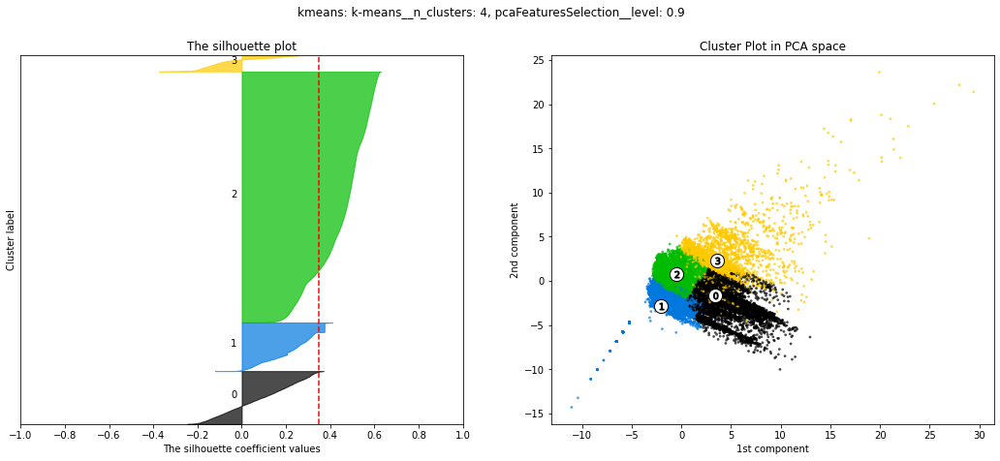

====>
Clusters population for kmeans: k-means__n_clusters: 5, pcaFeaturesSelection__level: 0.75


,0,1,2,3,4
0,15196,48880,3624,11818,10930


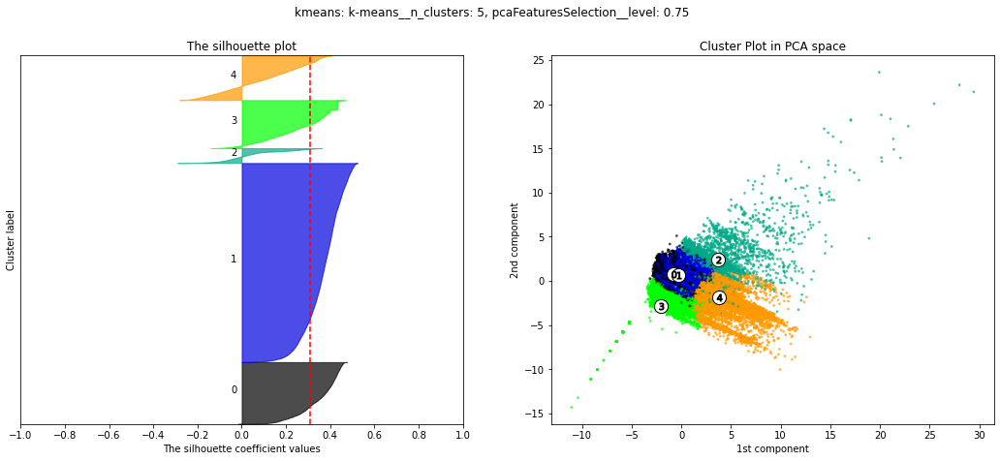

====>
Clusters population for kmeans: k-means__n_clusters: 5, pcaFeaturesSelection__level: 0.8


,0,1,2,3,4
0,3326,11011,14739,11738,49634


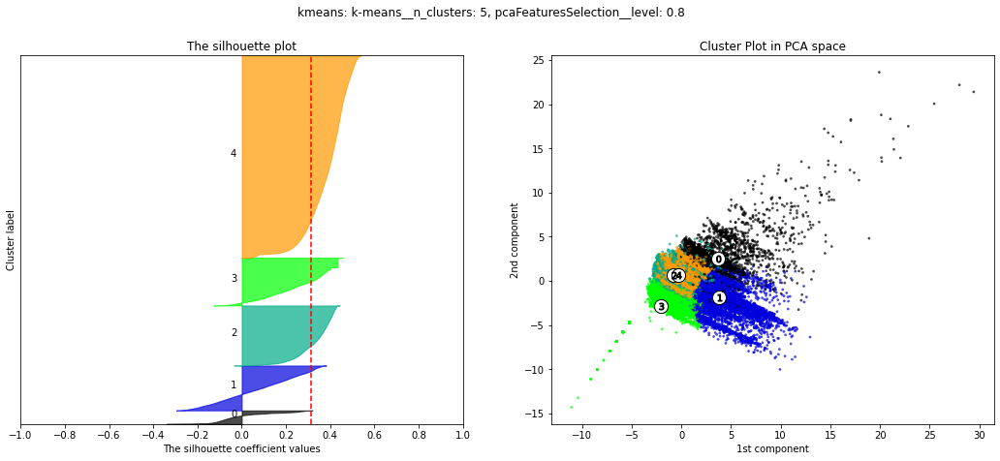

====>
Clusters population for kmeans: k-means__n_clusters: 5, pcaFeaturesSelection__level: 0.85


,0,1,2,3,4
0,3481,14717,11812,10810,49628


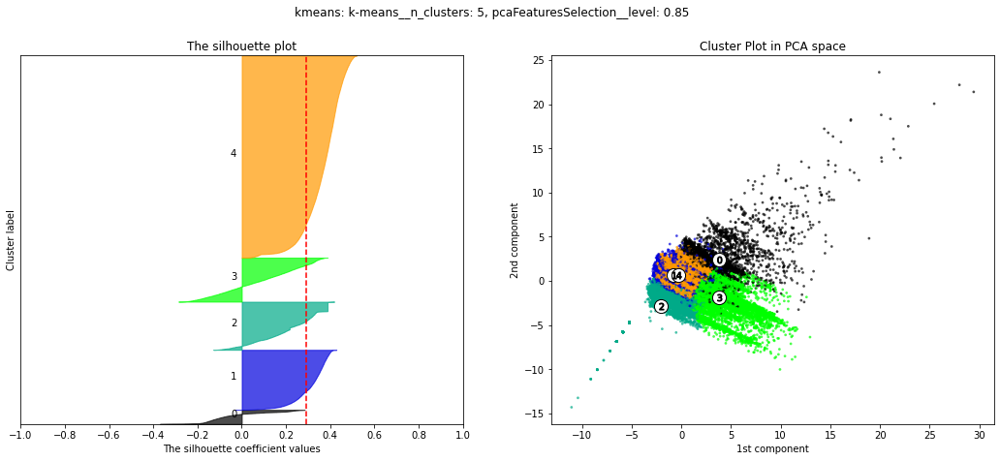

====>
Clusters population for kmeans: k-means__n_clusters: 5, pcaFeaturesSelection__level: 0.9


,0,1,2,3,4
0,14711,49629,3547,10767,11794


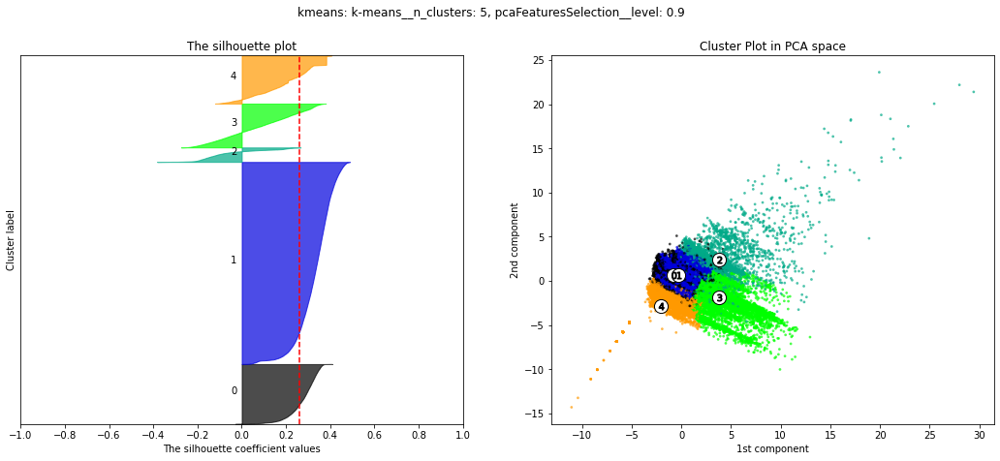

====>
Clusters population for kmeans: k-means__n_clusters: 6, pcaFeaturesSelection__level: 0.75


,0,1,2,3,4,5
0,15080,44759,10153,2749,3533,14174


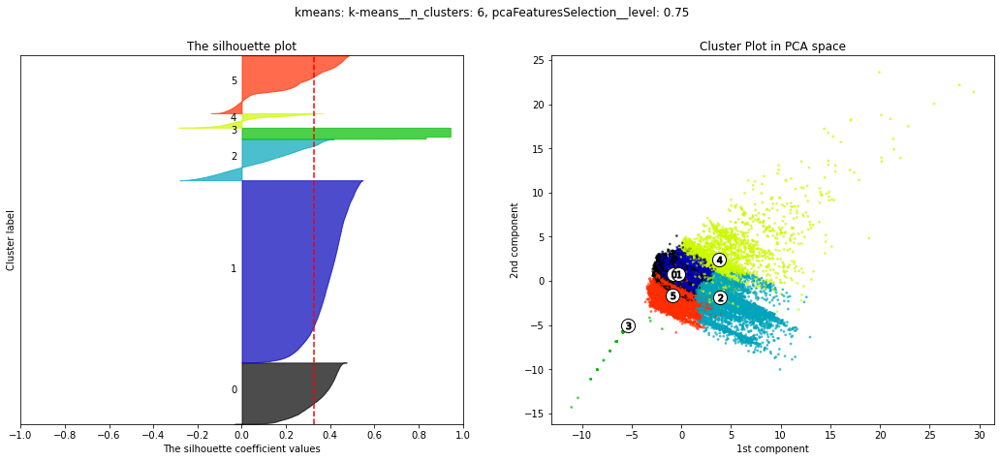

====>
Clusters population for kmeans: k-means__n_clusters: 6, pcaFeaturesSelection__level: 0.8


,0,1,2,3,4,5
0,10838,14817,9730,7606,46868,589


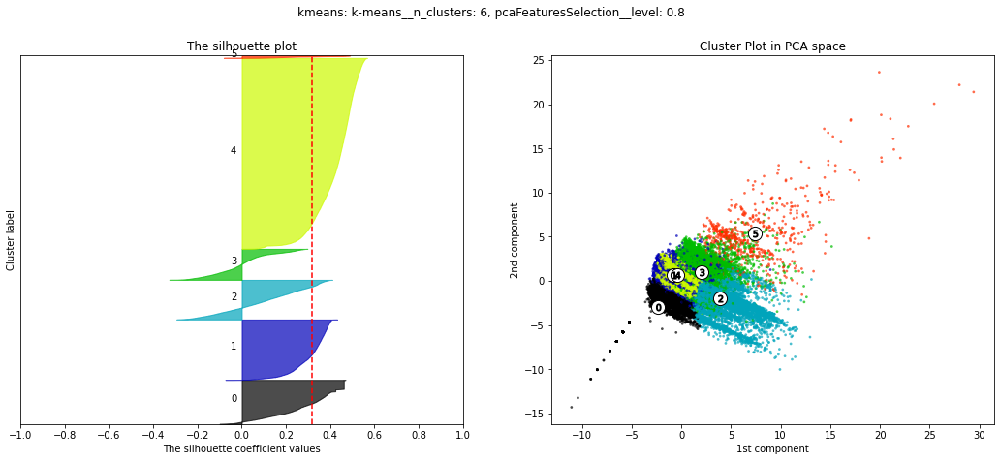

====>
Clusters population for kmeans: k-means__n_clusters: 6, pcaFeaturesSelection__level: 0.85


,0,1,2,3,4,5
0,10092,14295,14641,45282,2764,3374


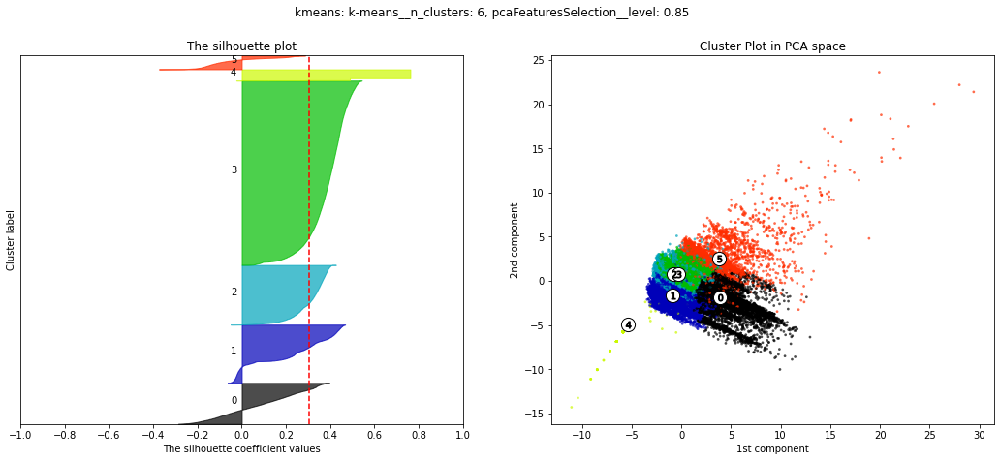

====>
Clusters population for kmeans: k-means__n_clusters: 6, pcaFeaturesSelection__level: 0.9


,0,1,2,3,4,5
0,14643,45369,14296,9945,2765,3430


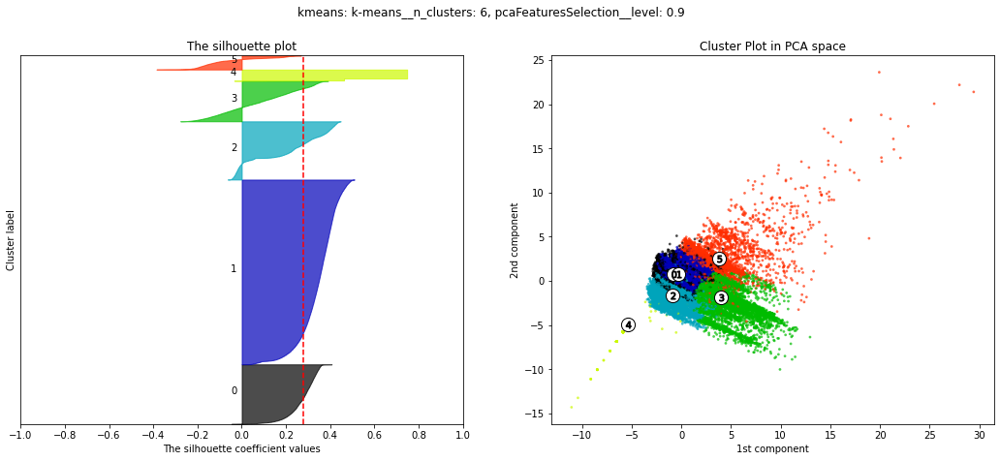

====>
Clusters population for kmeans2: k-means__n_clusters: 4


,0,1,2,3
0,17208,62519,2784,13585


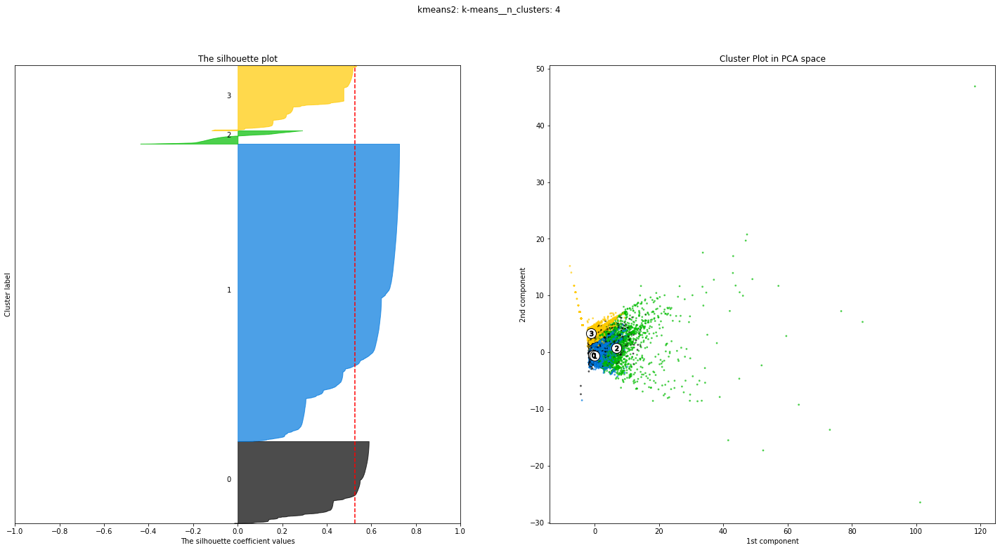

====>
Clusters population for kmeans2: k-means__n_clusters: 4


,0,1,2,3
0,59741,13060,16871,6424


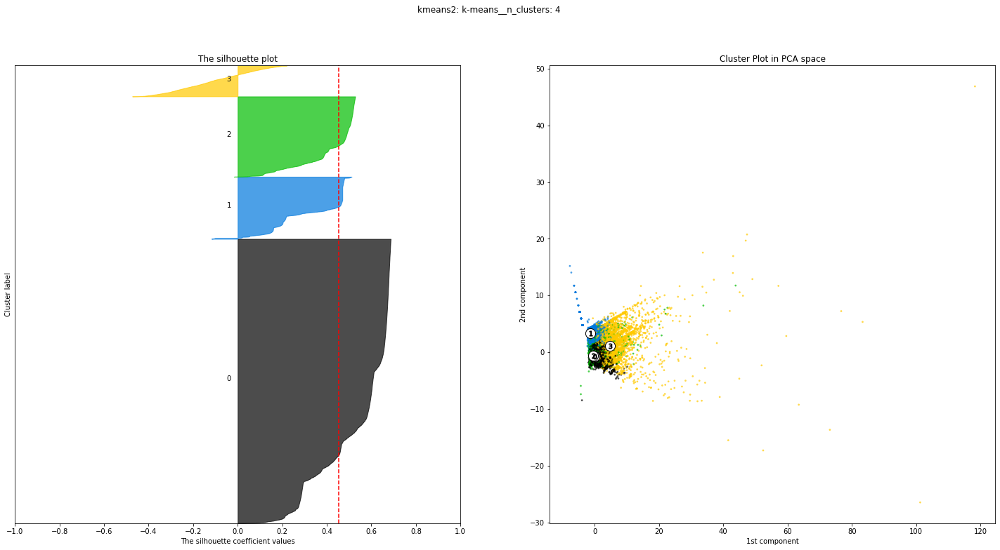

====>
Clusters population for kmeans2: k-means__n_clusters: 4


,0,1,2,3
0,14872,51832,17190,12202


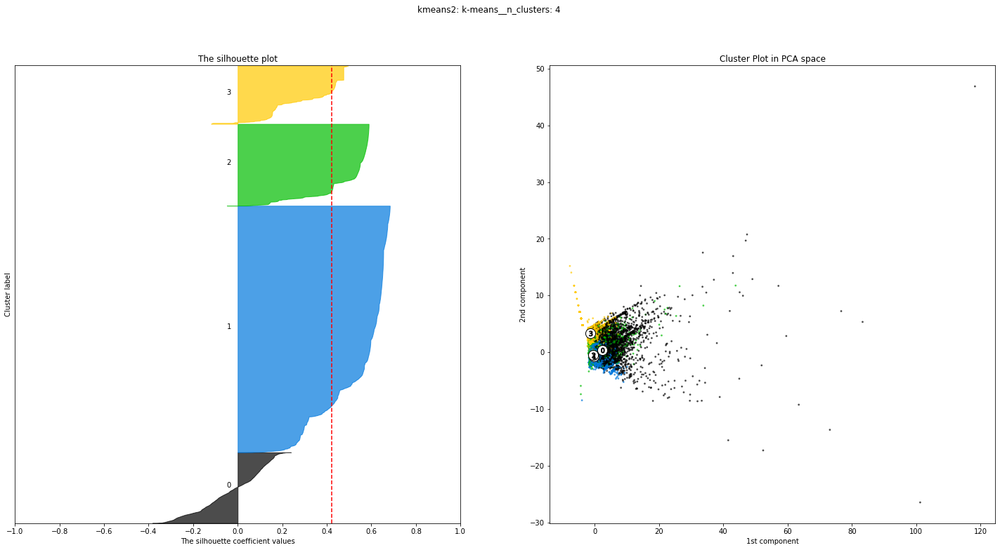

====>
Clusters population for kmeans1: k-means__n_clusters: 3


,0,1,2
0,40103,53775,2218


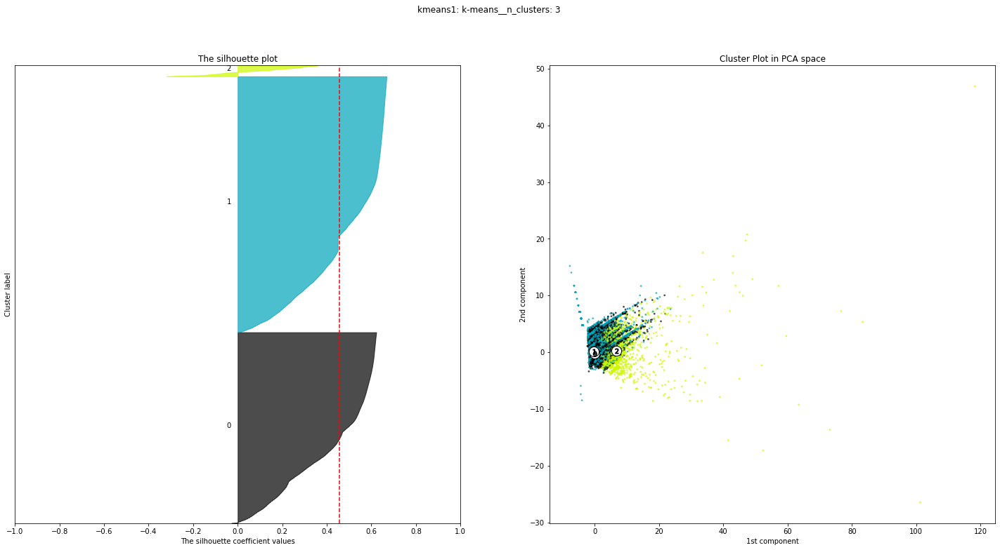

====>
Clusters population for kmeans1: k-means__n_clusters: 4


,0,1,2,3
0,53743,40089,2258,6


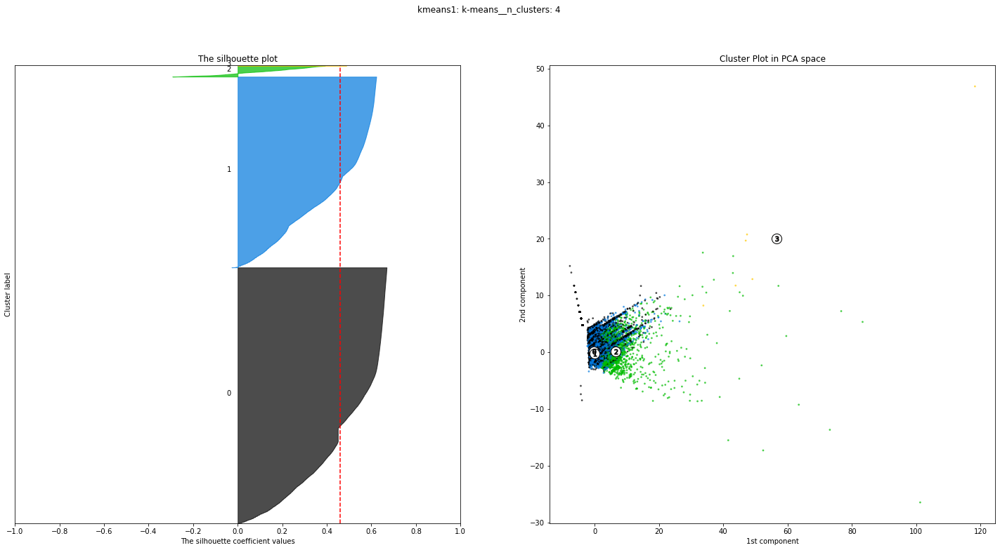

====>
Clusters population for kmeans1: k-means__n_clusters: 5


,0,1,2,3,4
0,39304,3823,52860,1,108


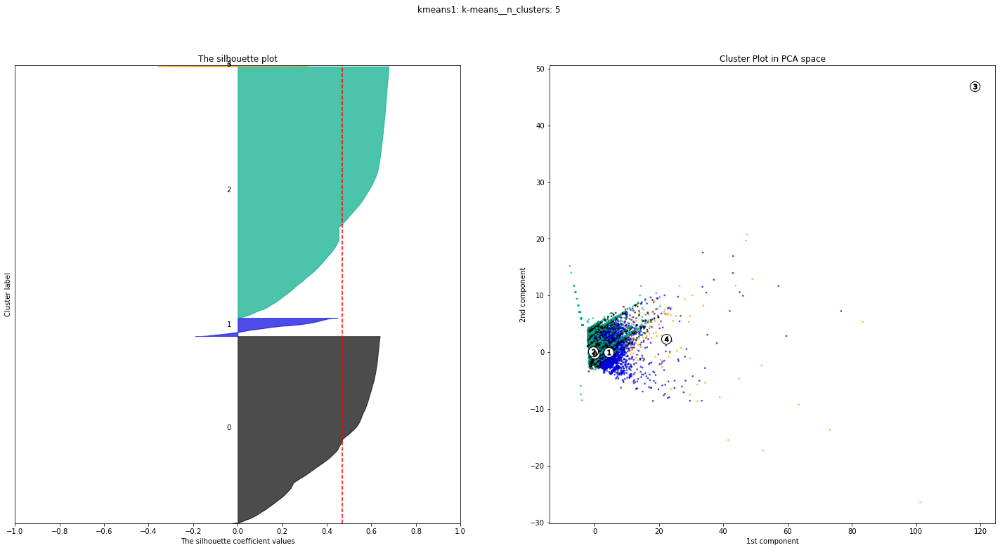

====>
Clusters population for kmeans2: k-means__n_clusters: 3


,0,1,2
0,64745,14110,17241


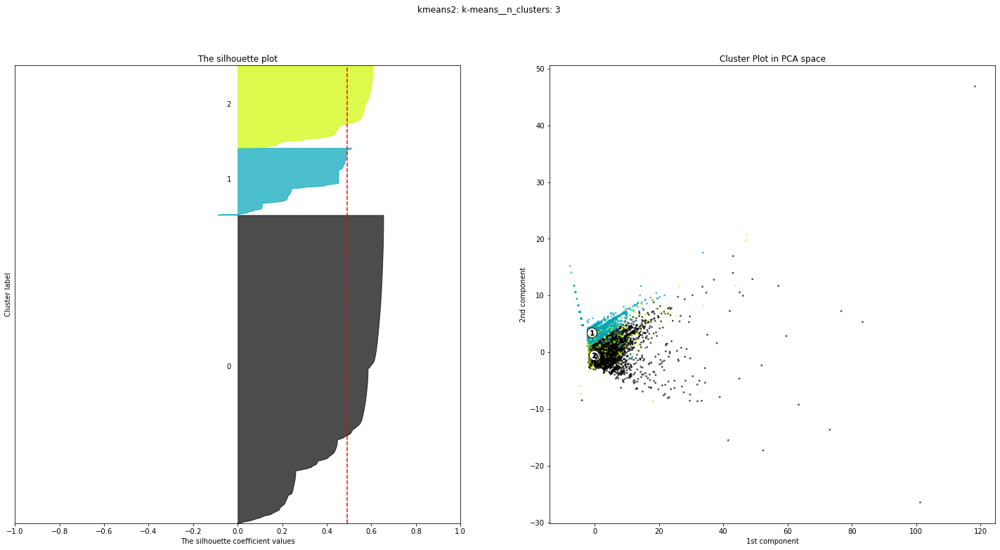

====>
Clusters population for kmeans2: k-means__n_clusters: 4


,0,1,2,3
0,62520,13584,2784,17208


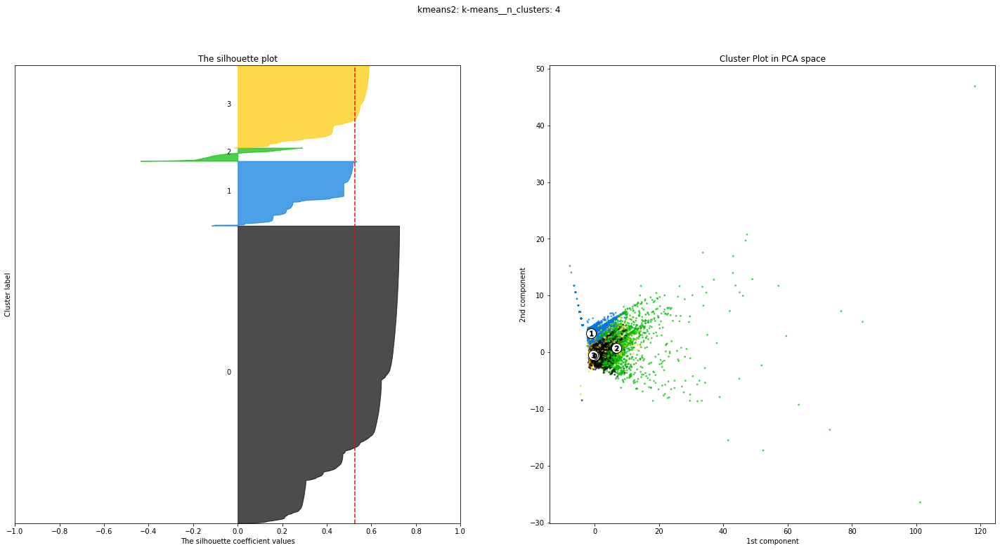

====>
Clusters population for kmeans2: k-means__n_clusters: 5


,0,1,2,3,4
0,13502,61924,1422,2157,17091


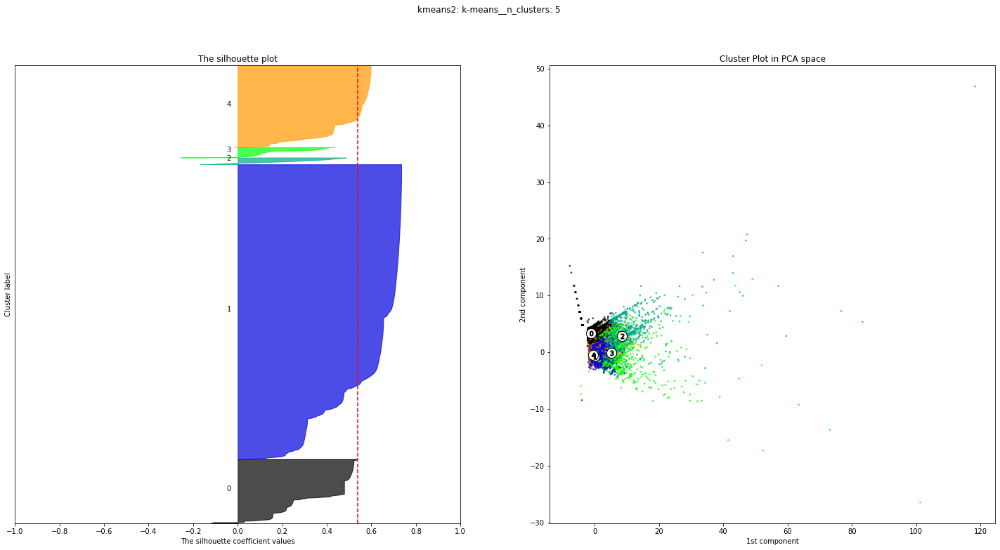

====>
Clusters population for kmeans3: k-means__n_clusters: 3


,0,1,2
0,18642,60443,17011


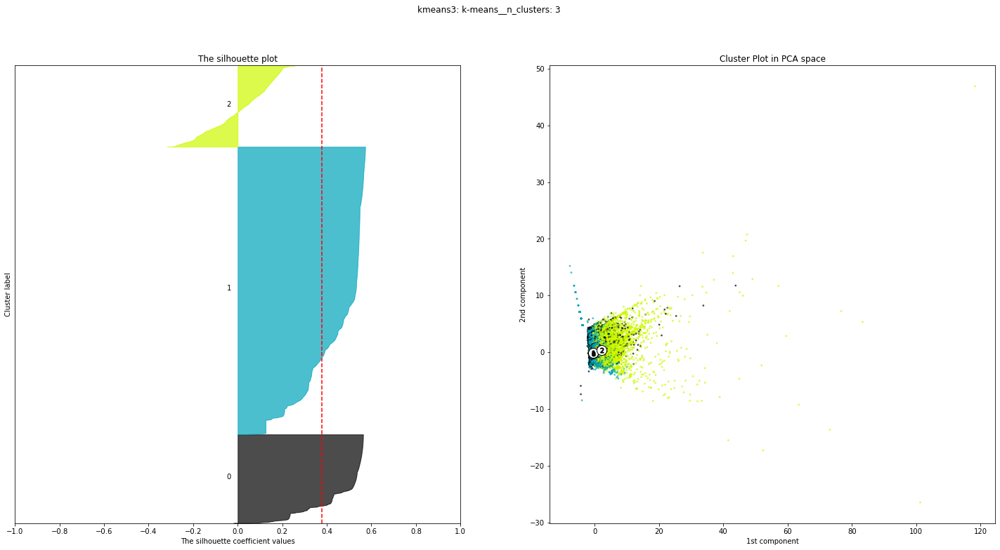

====>
Clusters population for kmeans3: k-means__n_clusters: 4


,0,1,2,3
0,51833,14866,17190,12207


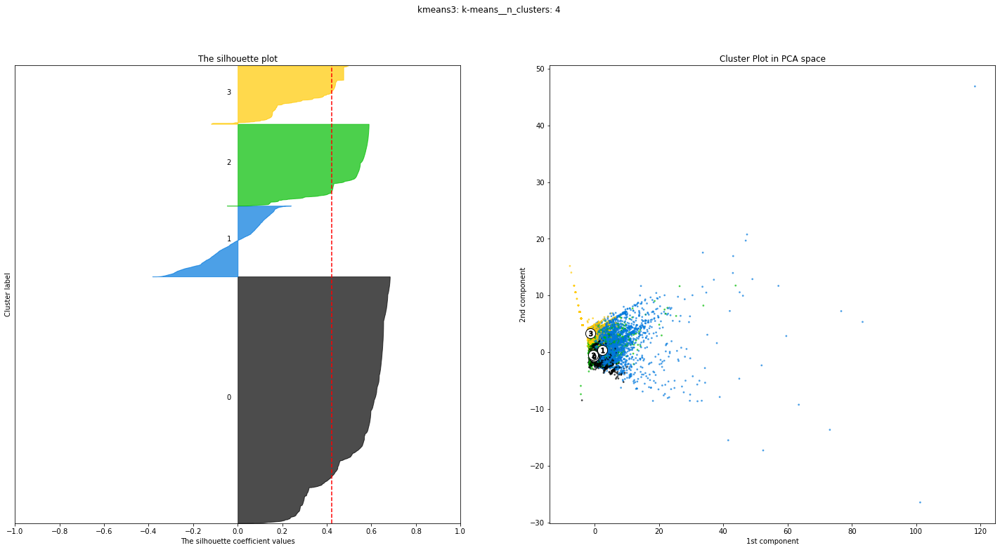

====>
Clusters population for kmeans3: k-means__n_clusters: 5


,0,1,2,3,4
0,17182,50007,2215,12118,14574


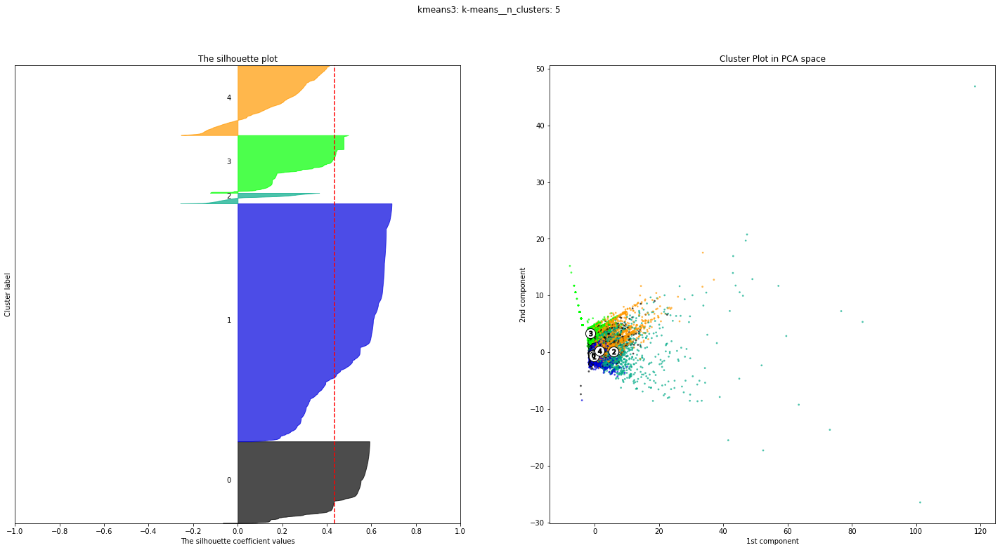

====>
Clusters population for kmeans4: k-means__n_clusters: 3


,0,1,2
0,8998,68418,18680


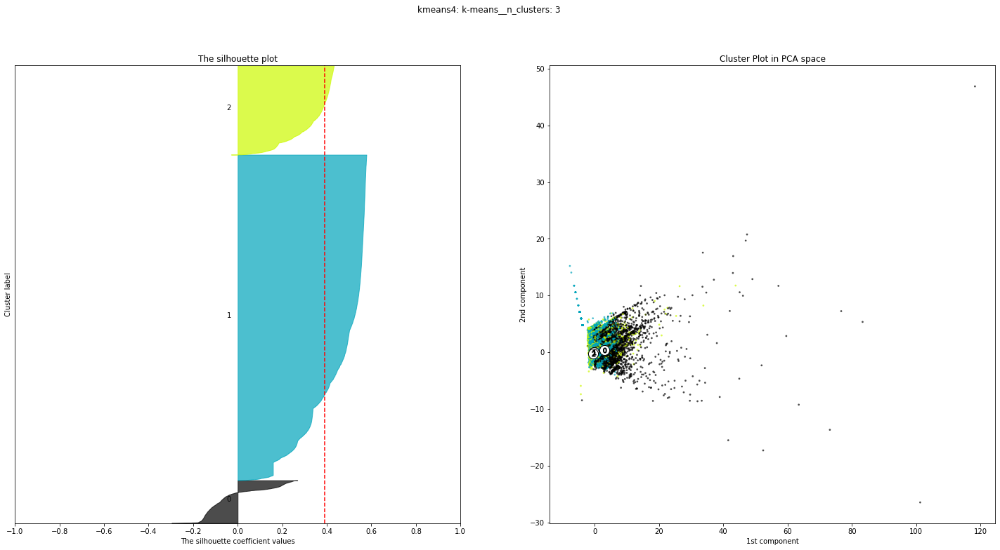

====>
Clusters population for kmeans4: k-means__n_clusters: 4


,0,1,2,3
0,62647,17239,13491,2719


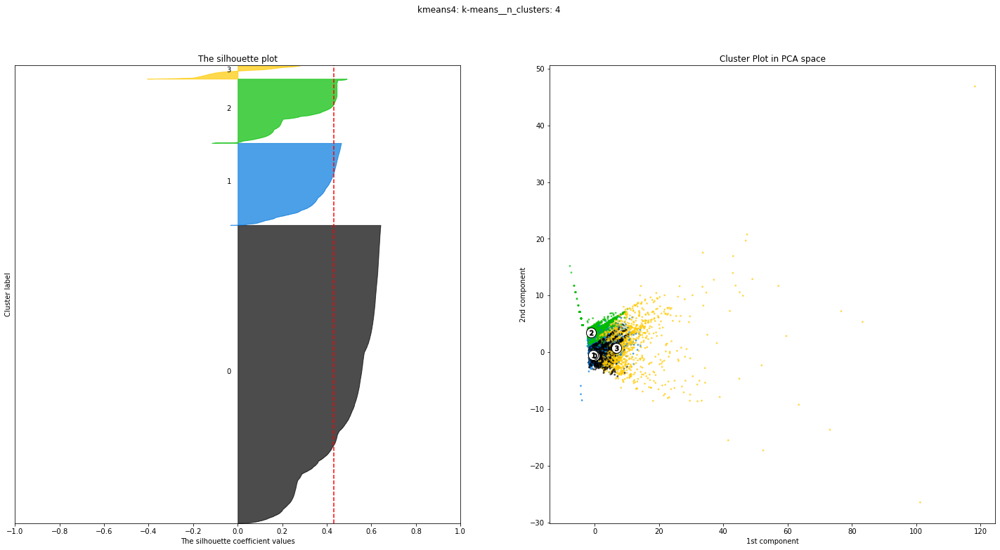

====>
Clusters population for kmeans4: k-means__n_clusters: 5


,0,1,2,3,4
0,61783,1689,17083,13360,2181


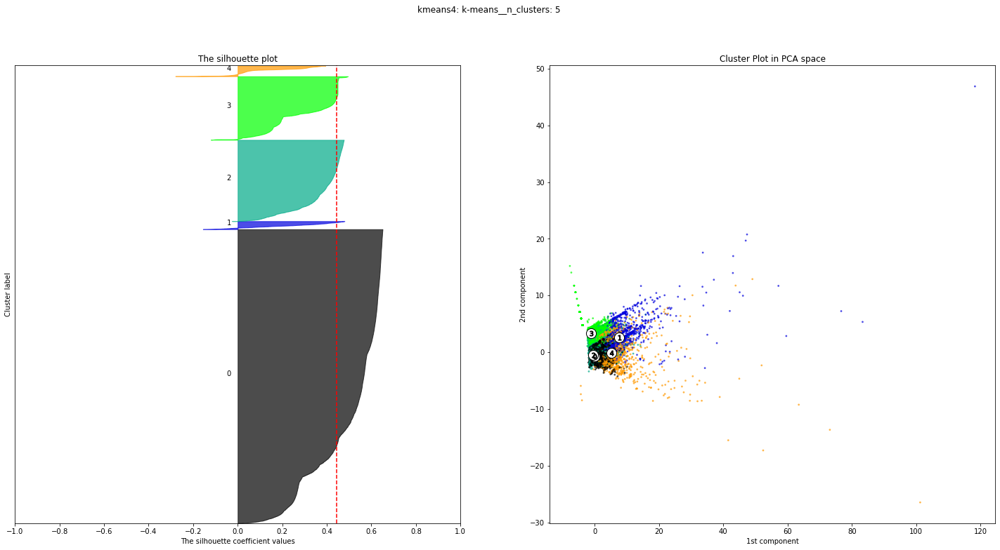

====>
Clusters population for RFM-kmeans: k-means__n_clusters: 4


,0,1,2,3
0,53749,2258,6,40083


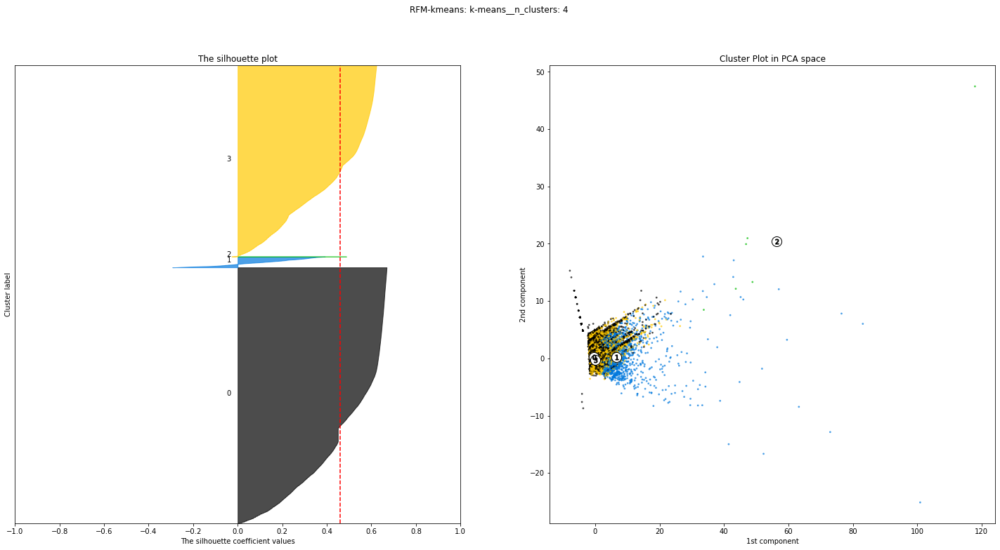

====>
Clusters population for RFM-kmeans: k-means__n_clusters: 4


,0,1,2,3
0,14061,177,7430,74428


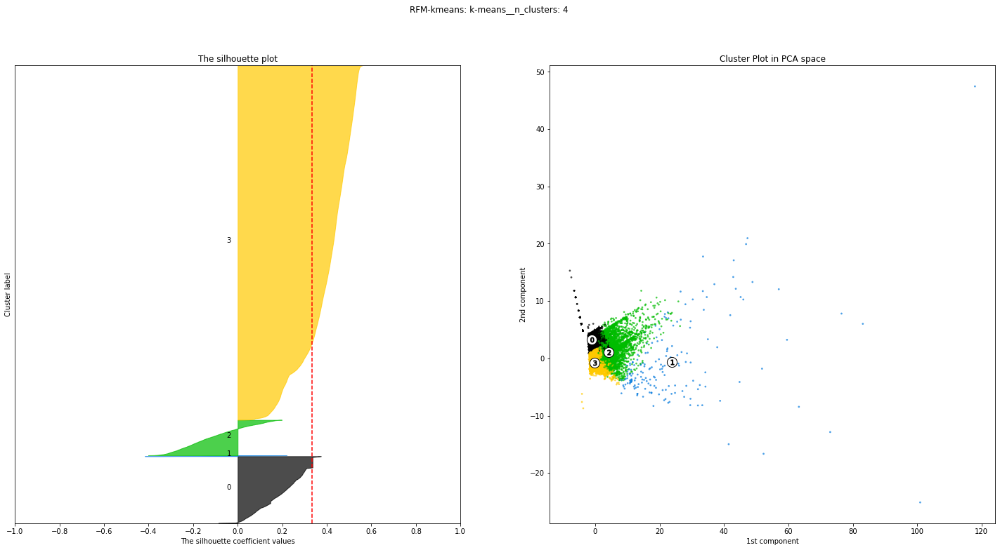

====>
Clusters population for RFM-kmeans: k-means__n_clusters: 4


,0,1,2,3
0,10365,83074,118,2539


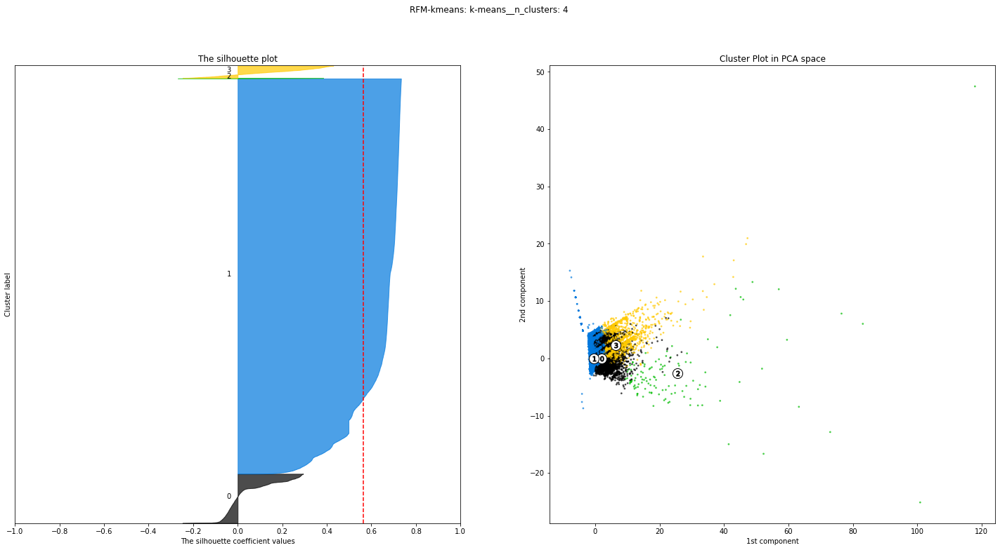

====>
Clusters population for highc-kmeans: k-means__n_clusters: 3


,0,1,2
0,74460,21383,253


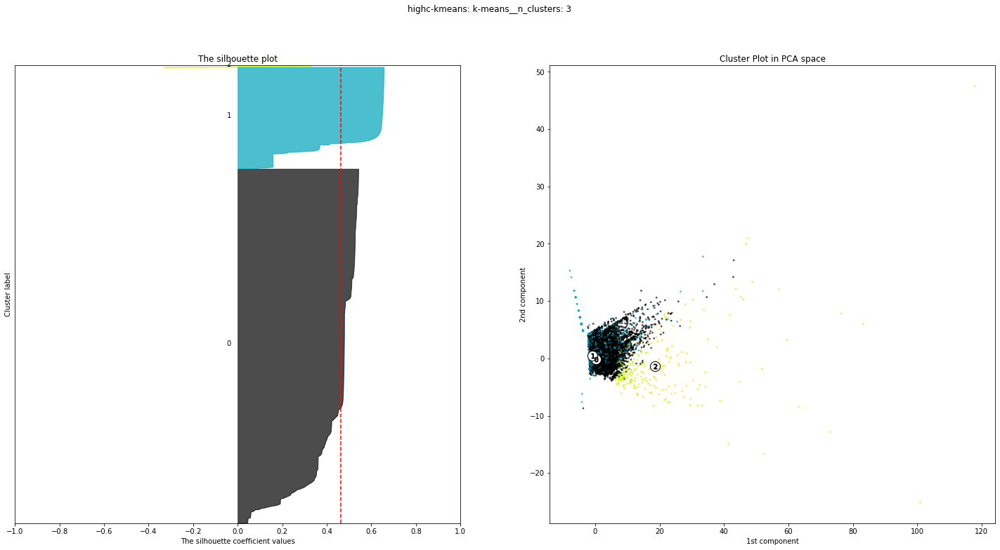

====>
Clusters population for highc-kmeans: k-means__n_clusters: 4


,0,1,2,3
0,67208,18623,133,10132


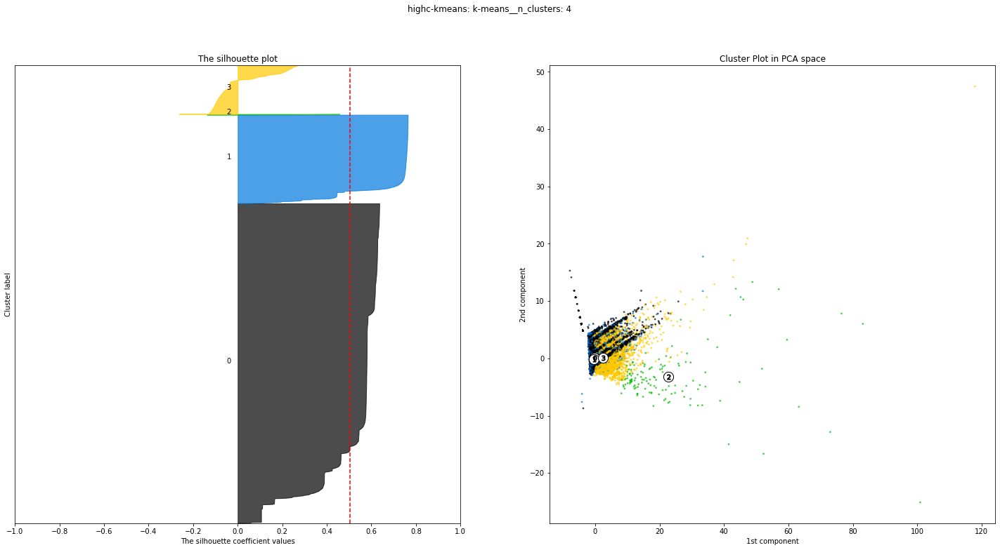

====>
Clusters population for lowc-kmeans: k-means__n_clusters: 3


,0,1,2
0,8357,1466,86273


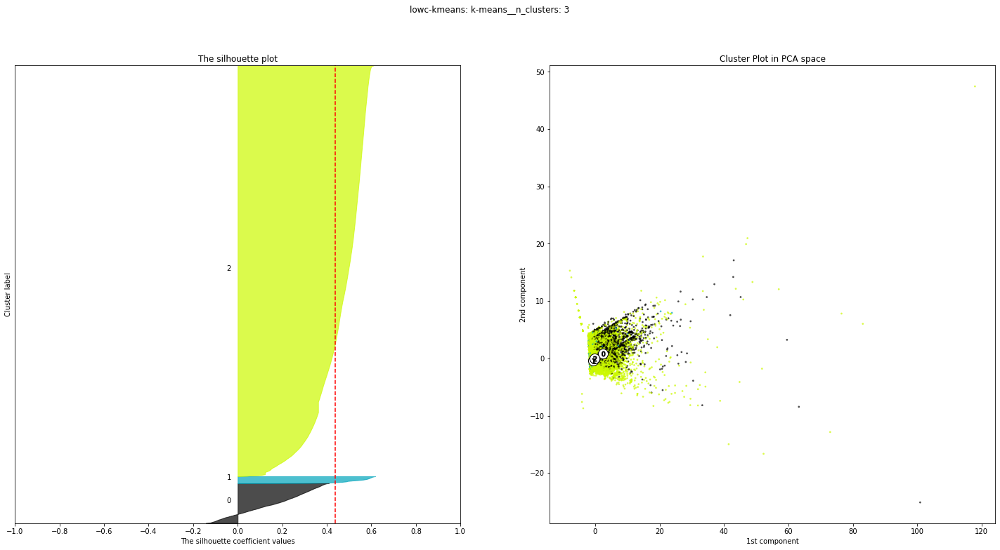

====>
Clusters population for lowc-kmeans: k-means__n_clusters: 4


,0,1,2,3
0,71794,15391,1464,7447


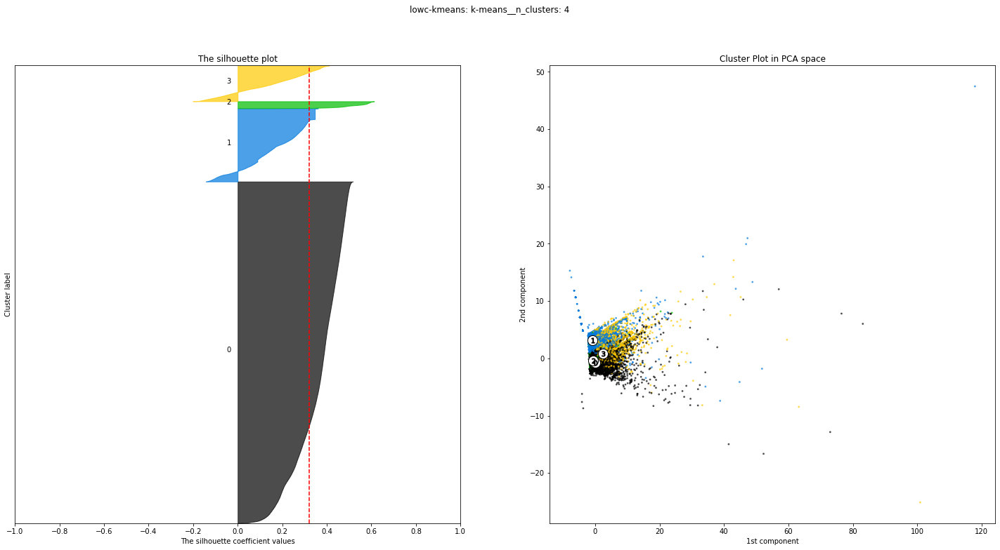

====>
Clusters population for RFM-kmeans: k-means__n_clusters: 4


,0,1,2,3
0,3048,13302,17212,62534


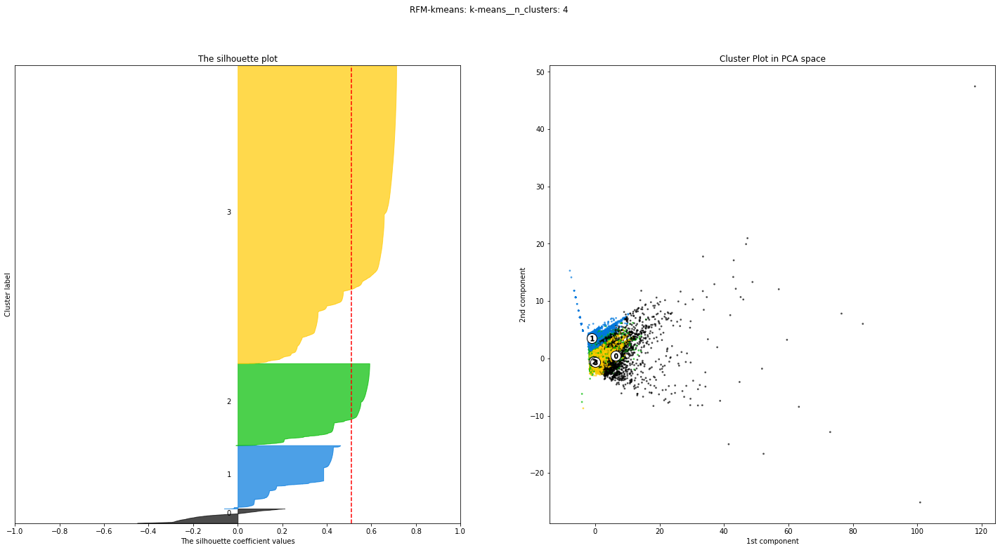

====>
Clusters population for kmeans5: kM__n_clusters: 3, FS__features: ['order_value_avg', 'review_score_avg', 'volume_max']


,0,1,2
0,19454,35321,38574


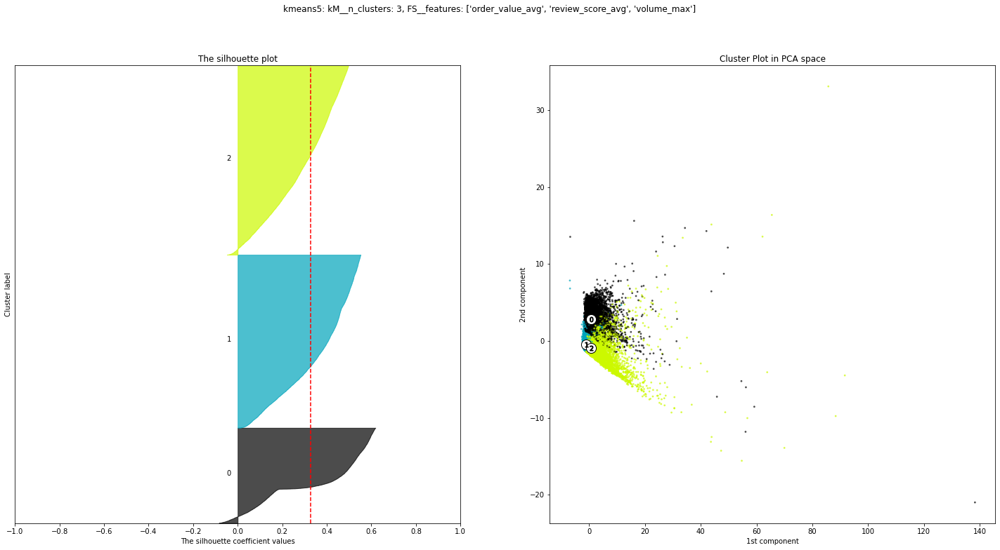

====>
Clusters population for kmeans5: kM__n_clusters: 3, FS__features: ['order_value_avg', 'review_score_avg', 'volume_max', 'r_freight_price_max']


,0,1,2
0,18587,50041,24721


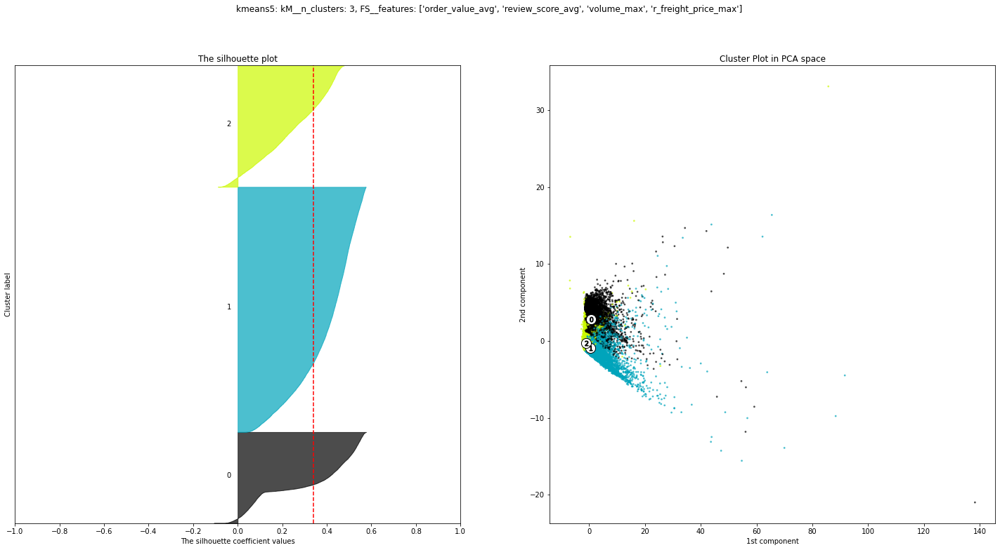

====>
Clusters population for kmeans5: kM__n_clusters: 3, FS__features: ['order_value_avg', 'review_score_avg', 'weight_max', 'r_freight_price_max']


,0,1,2
0,48990,18487,25872


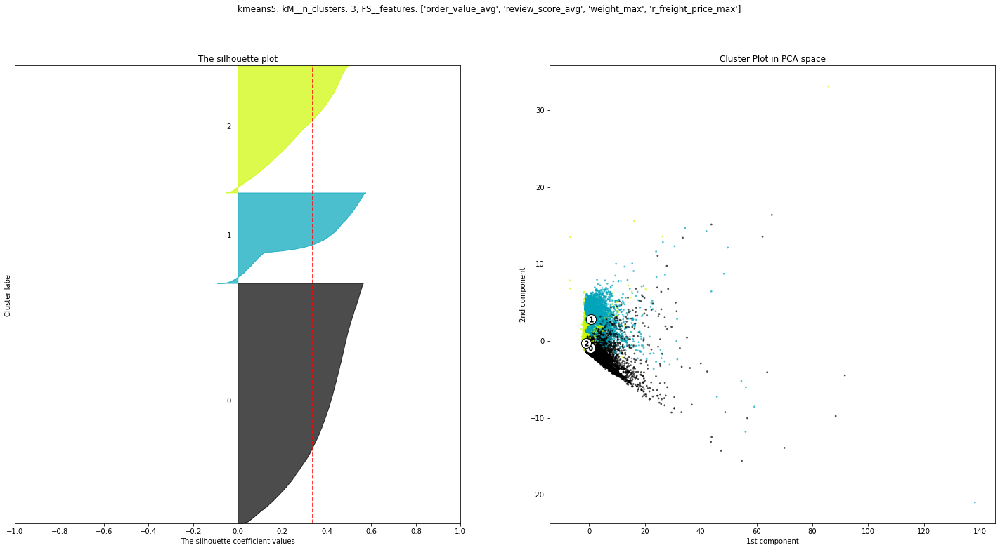

====>
Clusters population for kmeans5: kM__n_clusters: 3, FS__features: ['order_value_avg', 'review_score_avg', 'volume_max', 'weight_max', 'r_freight_price_max']


,0,1,2
0,29917,17854,45578


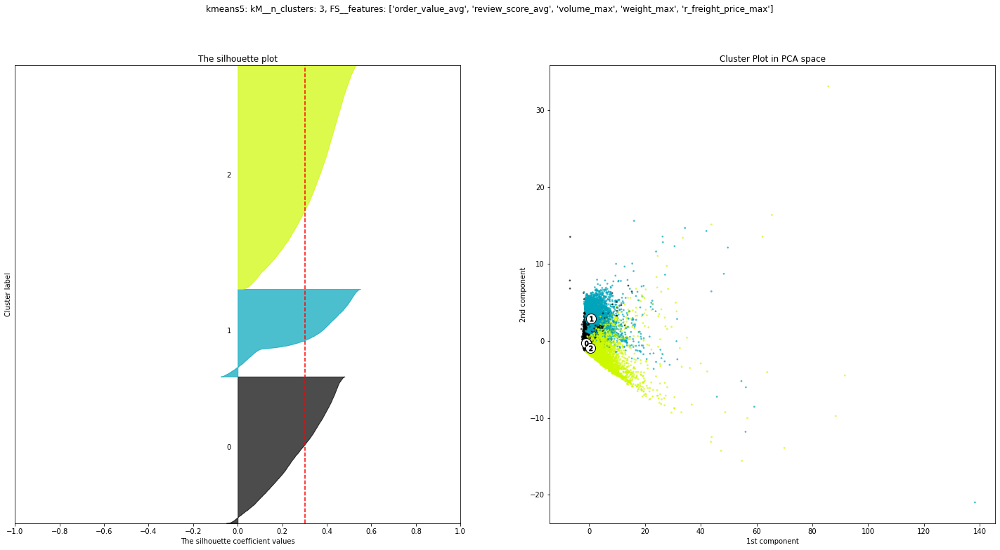

====>
Clusters population for kmeans5: kM__n_clusters: 3, FS__features: ['order_value_avg', 'review_score_avg', 'volume_max', 'weight_max', 'distance']


,0,1,2
0,65238,17884,10227


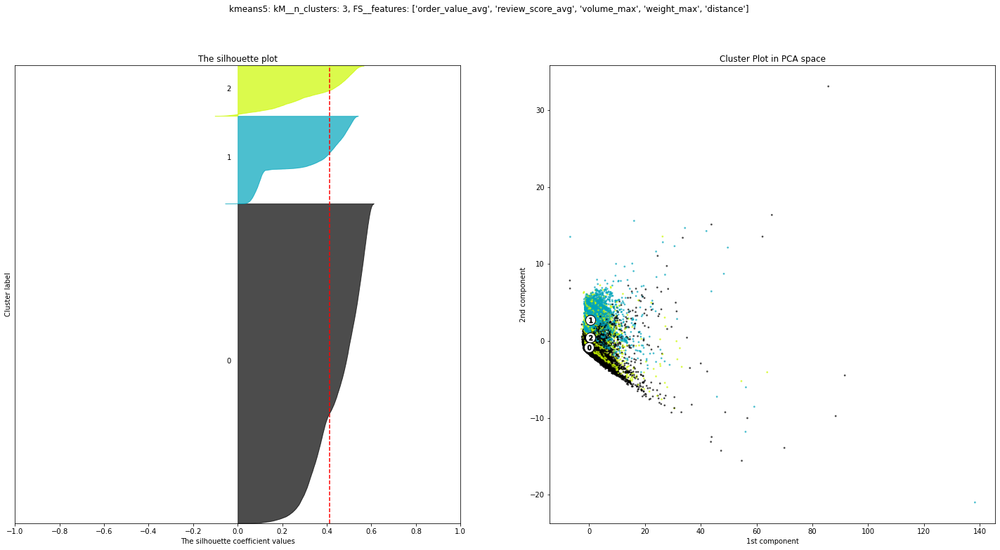

====>
Clusters population for kmeans5: kM__n_clusters: 3, FS__features: ['order_value_avg', 'review_score_avg', 'volume_max', 'payment_installments_max', 'nb_credit_card']


,0,1,2
0,18051,56392,18906


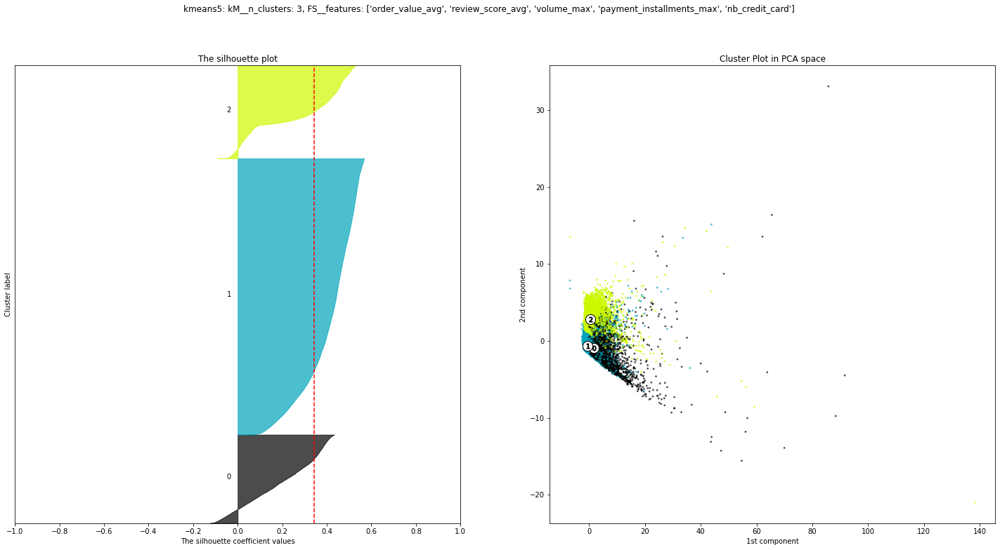

====>
Clusters population for kmeans5: kM__n_clusters: 3, FS__features: ['order_value_avg', 'review_score_avg', 'volume_max', 'weight_max', 'r_freight_price_max', 'payment_installments_max', 'nb_credit_card', 'distance']


,0,1,2
0,10240,65198,17911


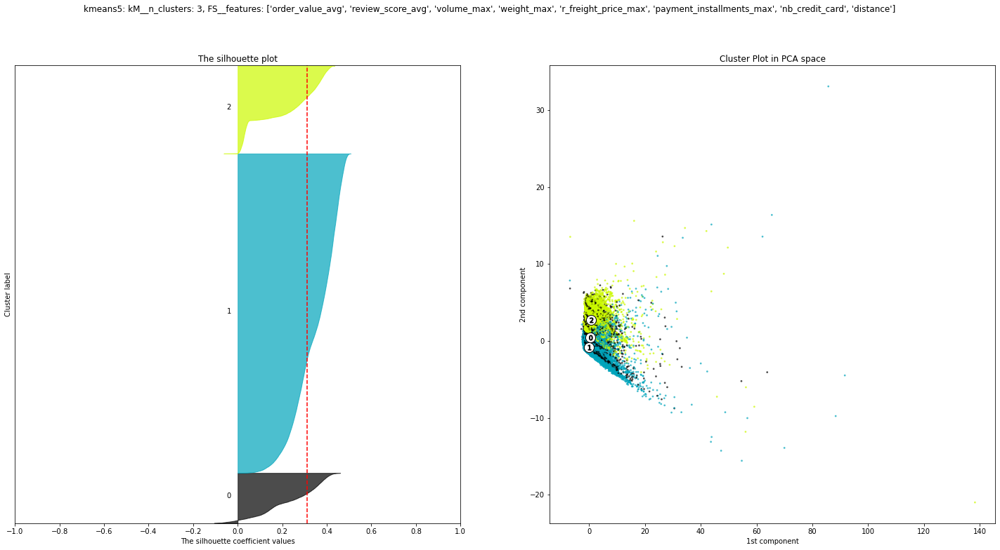

====>
Clusters population for kmeans5: kM__n_clusters: 4, FS__features: ['order_value_avg', 'review_score_avg', 'volume_max']


,0,1,2,3
0,30784,12418,30560,19587


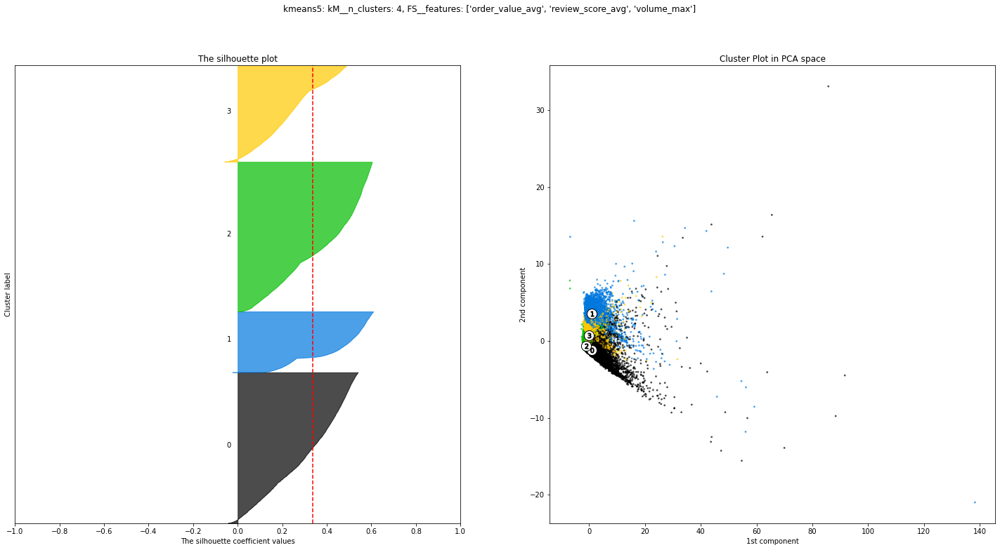

====>
Clusters population for kmeans5: kM__n_clusters: 4, FS__features: ['order_value_avg', 'review_score_avg', 'volume_max', 'r_freight_price_max']


,0,1,2,3
0,10702,33164,18159,31324


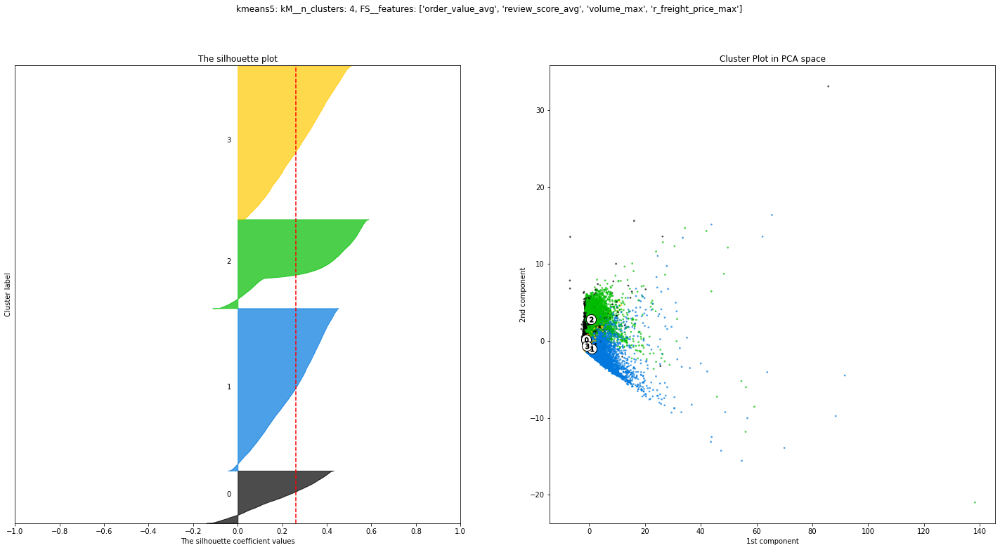

====>
Clusters population for kmeans5: kM__n_clusters: 4, FS__features: ['order_value_avg', 'review_score_avg', 'weight_max', 'r_freight_price_max']


,0,1,2,3
0,13075,26286,17778,36210


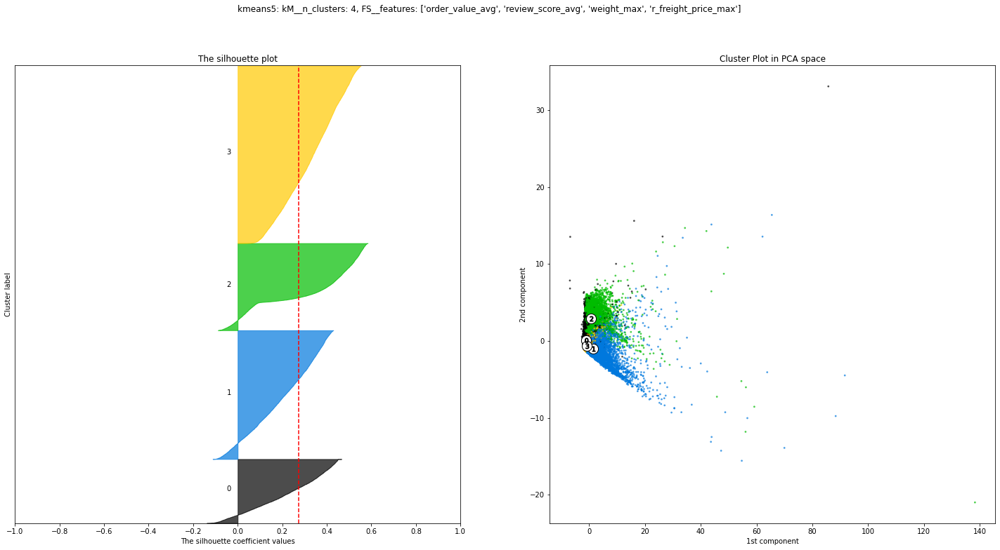

====>
Clusters population for kmeans5: kM__n_clusters: 4, FS__features: ['order_value_avg', 'review_score_avg', 'volume_max', 'weight_max', 'r_freight_price_max']


,0,1,2,3
0,28015,14823,17021,33490


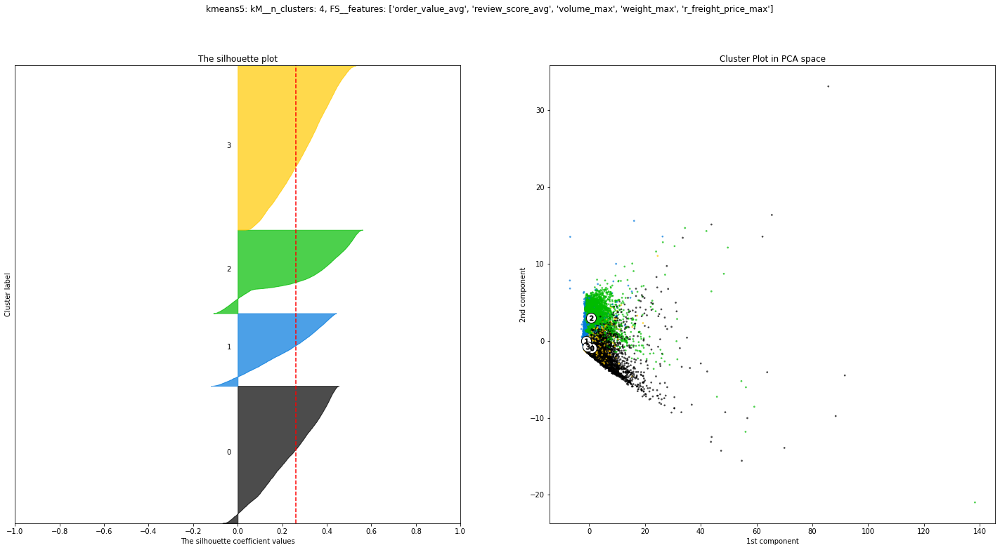

====>
Clusters population for kmeans5: kM__n_clusters: 4, FS__features: ['order_value_avg', 'review_score_avg', 'volume_max', 'weight_max', 'distance']


,0,1,2,3
0,37601,30291,9925,15532


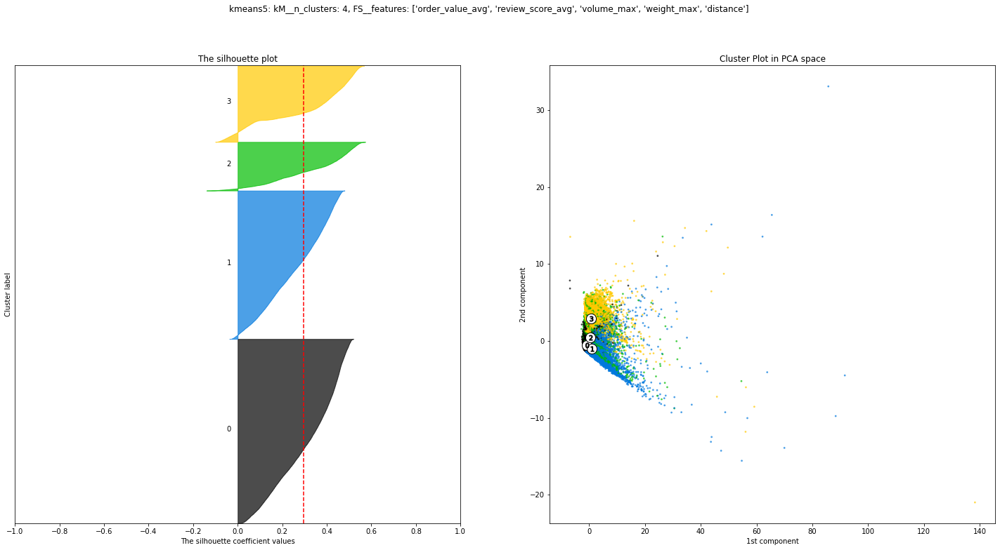

====>
Clusters population for kmeans5: kM__n_clusters: 4, FS__features: ['order_value_avg', 'review_score_avg', 'volume_max', 'payment_installments_max', 'nb_credit_card']


,0,1,2,3
0,30338,14265,17224,31522


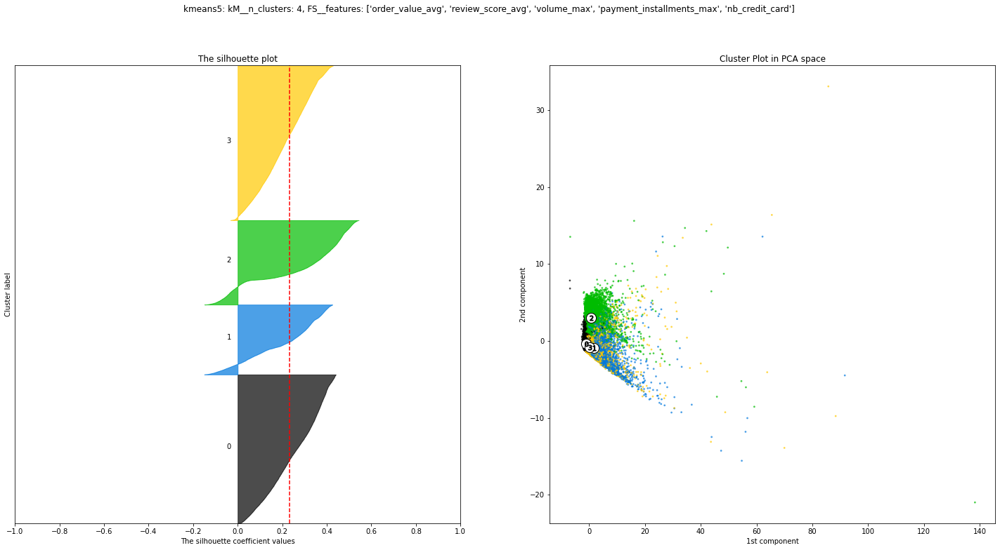

====>
Clusters population for kmeans5: kM__n_clusters: 4, FS__features: ['order_value_avg', 'review_score_avg', 'volume_max', 'weight_max', 'r_freight_price_max', 'payment_installments_max', 'nb_credit_card', 'distance']


,0,1,2,3
0,33948,14864,9852,34685


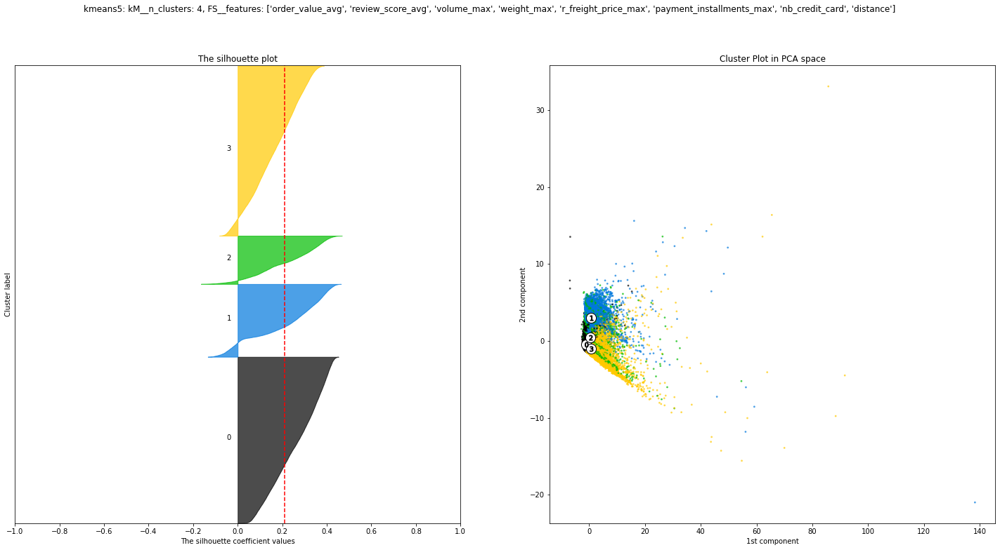

====>
Clusters population for kmeans5: kM__n_clusters: 5, FS__features: ['order_value_avg', 'review_score_avg', 'volume_max']


,0,1,2,3,4
0,28074,12416,11104,22514,19241


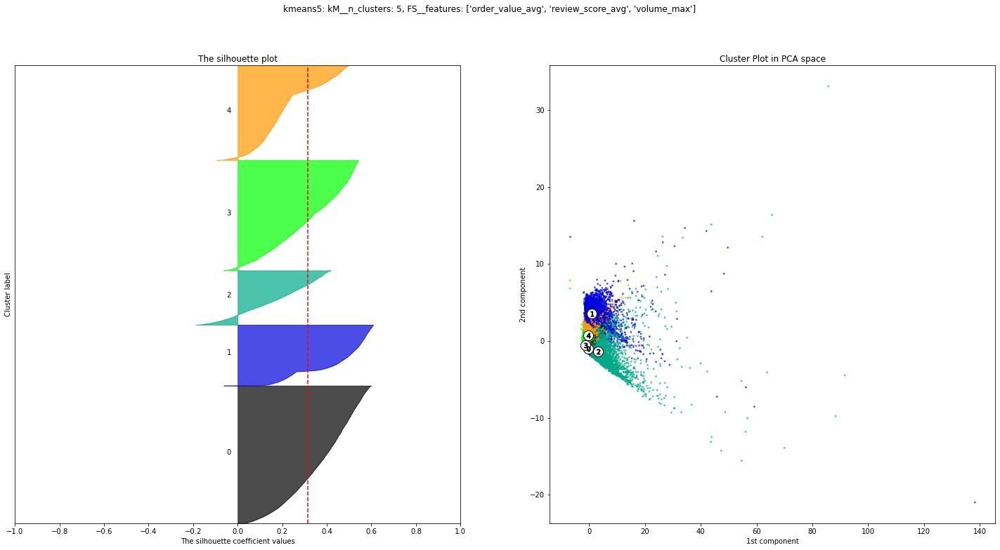

====>
Clusters population for kmeans5: kM__n_clusters: 5, FS__features: ['order_value_avg', 'review_score_avg', 'volume_max', 'r_freight_price_max']


,0,1,2,3,4
0,9693,27912,12208,17525,26011


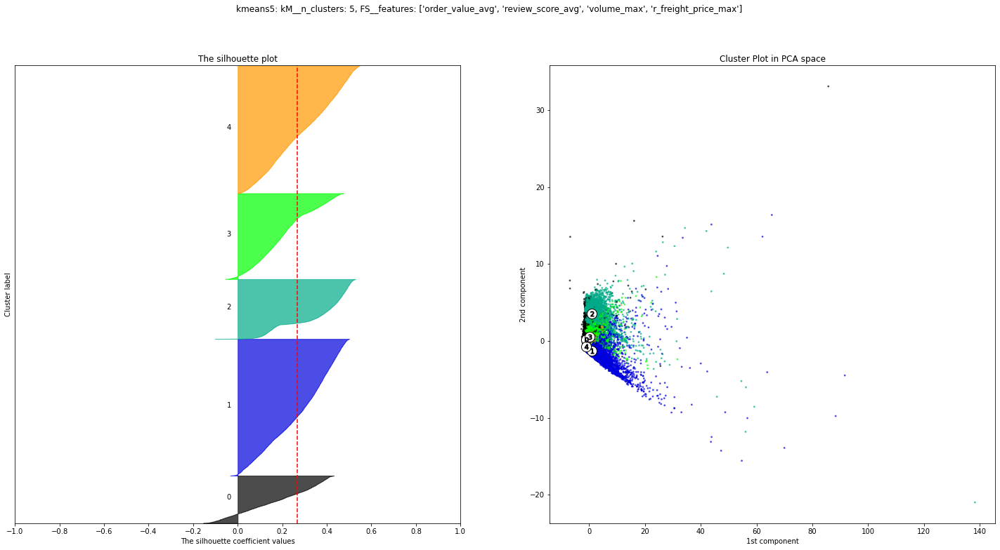

====>
Clusters population for kmeans5: kM__n_clusters: 5, FS__features: ['order_value_avg', 'review_score_avg', 'weight_max', 'r_freight_price_max']


,0,1,2,3,4
0,29538,12273,21415,17498,12625


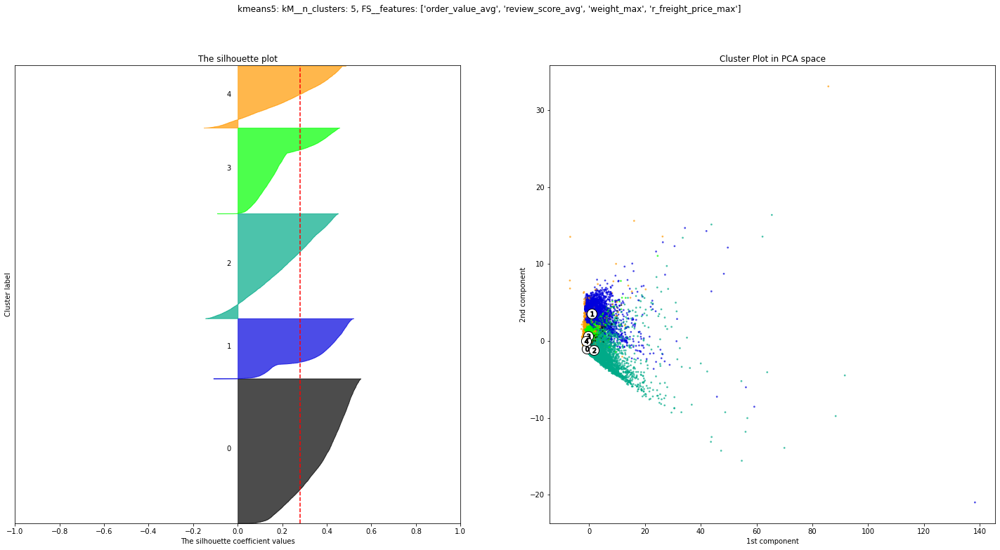

====>
Clusters population for kmeans5: kM__n_clusters: 5, FS__features: ['order_value_avg', 'review_score_avg', 'volume_max', 'weight_max', 'r_freight_price_max']


,0,1,2,3,4
0,16263,12276,22845,13791,28174


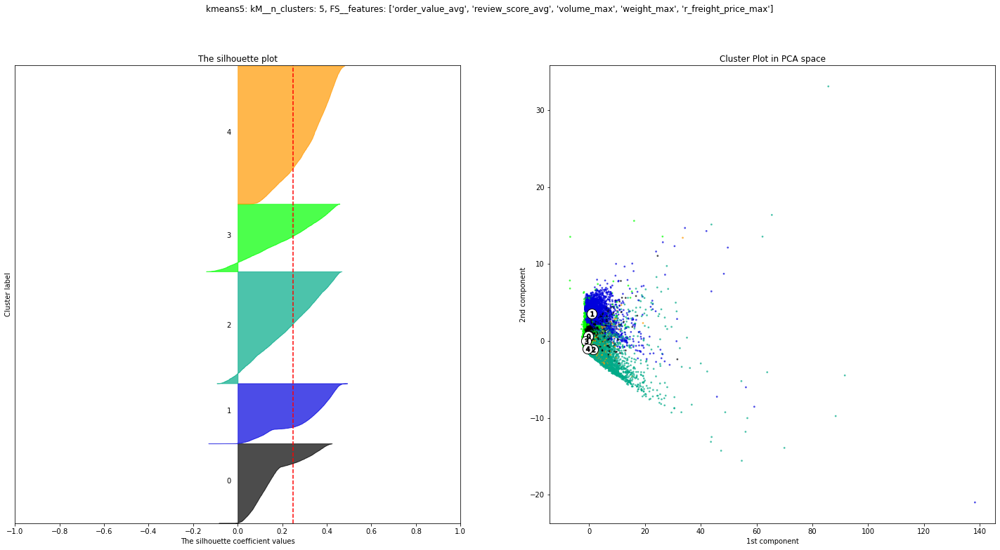

====>
Clusters population for kmeans5: kM__n_clusters: 5, FS__features: ['order_value_avg', 'review_score_avg', 'volume_max', 'weight_max', 'distance']


,0,1,2,3,4
0,16198,26573,9857,11105,29616


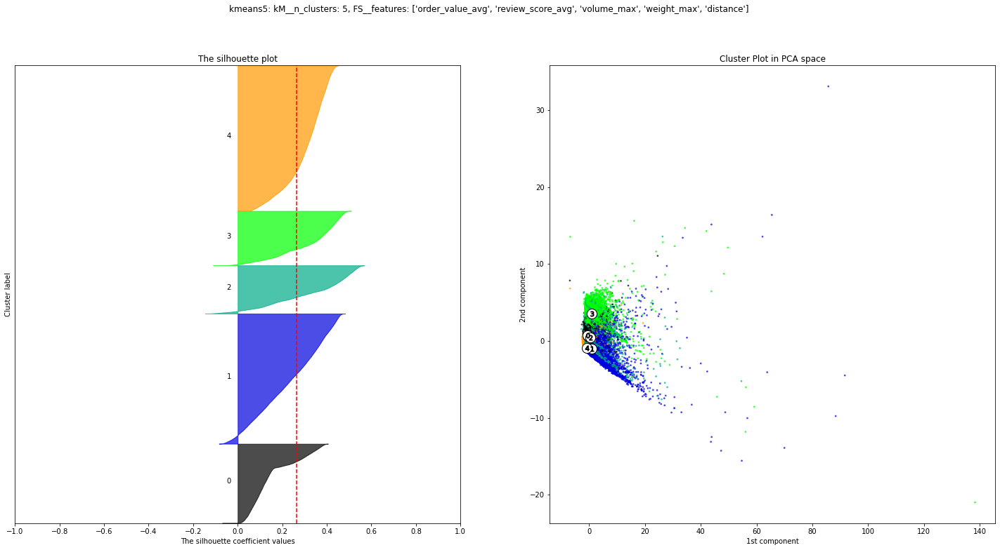

====>
Clusters population for kmeans5: kM__n_clusters: 5, FS__features: ['order_value_avg', 'review_score_avg', 'volume_max', 'payment_installments_max', 'nb_credit_card']


,0,1,2,3,4
0,25580,12325,24993,13527,16924


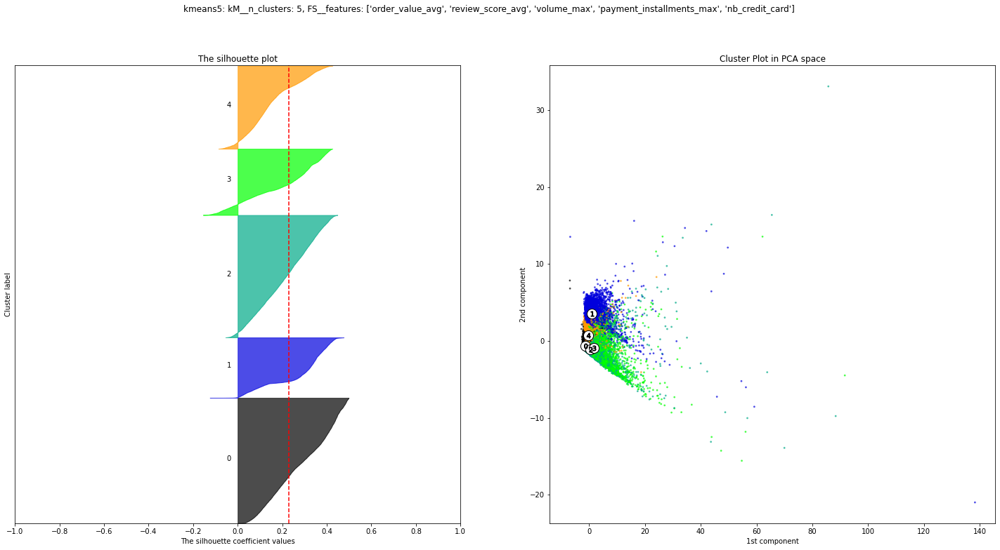

====>
Clusters population for kmeans5: kM__n_clusters: 5, FS__features: ['order_value_avg', 'review_score_avg', 'volume_max', 'weight_max', 'r_freight_price_max', 'payment_installments_max', 'nb_credit_card', 'distance']


,0,1,2,3,4
0,9592,11658,24623,12862,34614


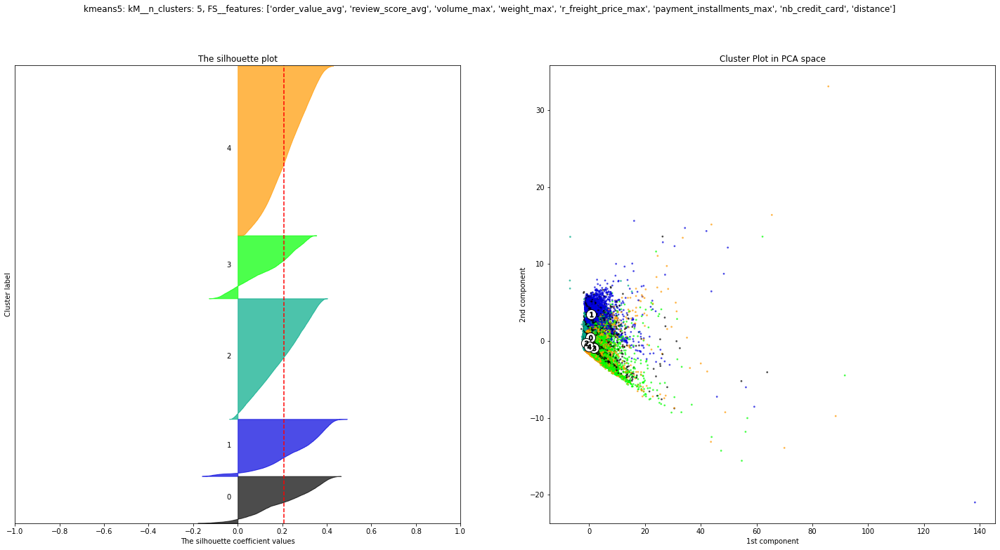

Exception for kmeans-wPCA (params: {'memory': None, 'steps': [('FS', <__main__.RuleSelection object at 0x7f439a653910>), ('SC', <__main__.FeaturesScaler object at 0x7f439a6538b0>), ('pcaFeaturesSelection', <__main__.PCAFeaturesSelection object at 0x7f439a653370>), ('k-means', KMeans(algorithm='full', max_iter=500, n_clusters=2, n_init=30))], 'verbose': False, 'FS': <__main__.RuleSelection object at 0x7f439a653910>, 'SC': <__main__.FeaturesScaler object at 0x7f439a6538b0>, 'pcaFeaturesSelection': <__main__.PCAFeaturesSelection object at 0x7f439a653370>, 'k-means': KMeans(algorithm='full', max_iter=500, n_clusters=2, n_init=30), 'k-means__algorithm': 'full', 'k-means__copy_x': True, 'k-means__init': 'k-means++', 'k-means__max_iter': 500, 'k-means__n_clusters': 2, 'k-means__n_init': 30, 'k-means__random_state': None, 'k-means__tol': 0.0001, 'k-means__verbose': 0, 'pcaFeaturesSelection__level': 0.2}): exception (Found array with 0 feature(s) (shape=(93349, 0)) while a minimum of 1 is requi

,0,1
0,89163,4186


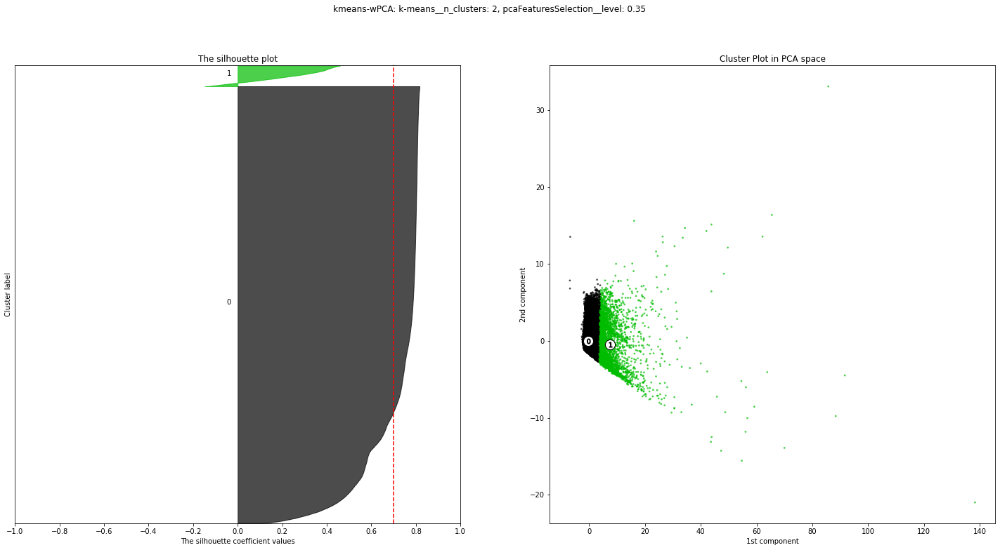

====>
Clusters population for kmeans-wPCA: k-means__n_clusters: 2, pcaFeaturesSelection__level: 0.5


,0,1
0,89049,4300


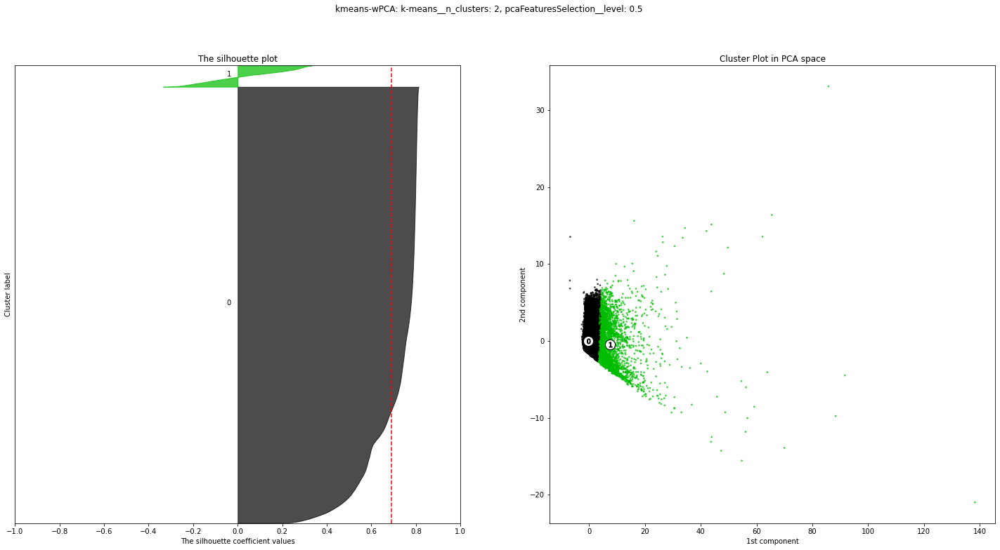

====>
Clusters population for kmeans-wPCA: k-means__n_clusters: 2, pcaFeaturesSelection__level: 0.6


,0,1
0,4326,89023


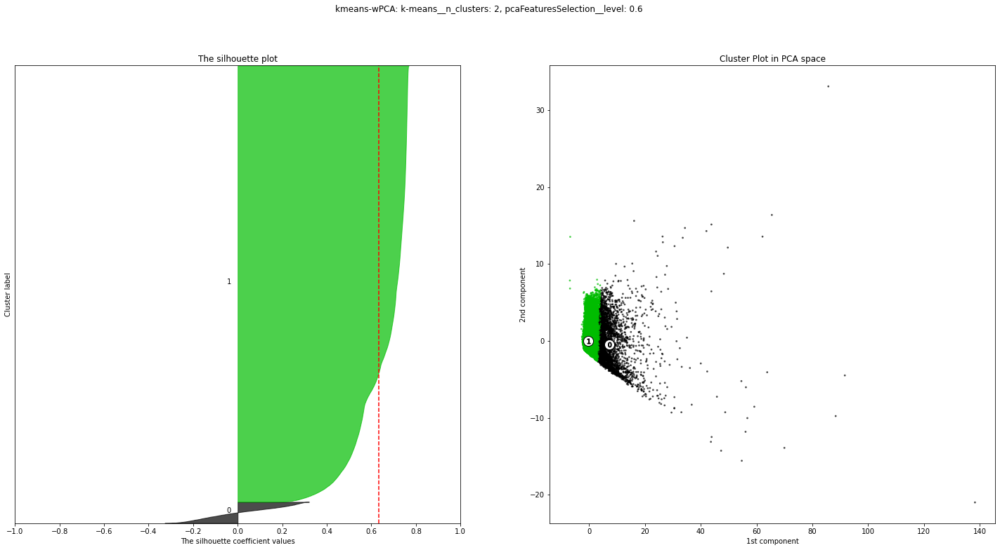

====>
Clusters population for kmeans-wPCA: k-means__n_clusters: 2, pcaFeaturesSelection__level: 0.65


,0,1
0,4313,89036


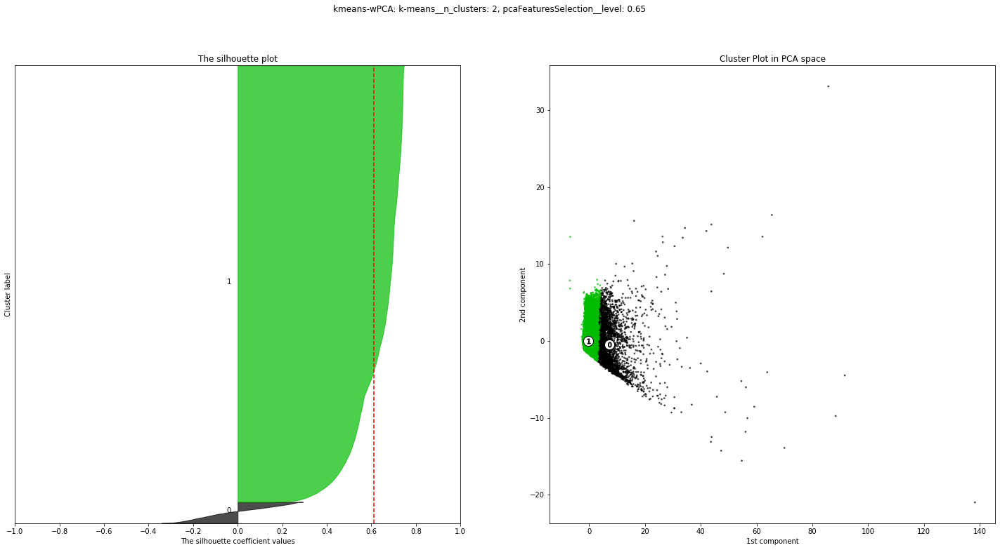

Exception for kmeans-wPCA (params: {'memory': None, 'steps': [('FS', <__main__.RuleSelection object at 0x7f439a653910>), ('SC', <__main__.FeaturesScaler object at 0x7f439a6538b0>), ('pcaFeaturesSelection', <__main__.PCAFeaturesSelection object at 0x7f439a653370>), ('k-means', KMeans(algorithm='full', max_iter=500, n_clusters=3, n_init=30))], 'verbose': False, 'FS': <__main__.RuleSelection object at 0x7f439a653910>, 'SC': <__main__.FeaturesScaler object at 0x7f439a6538b0>, 'pcaFeaturesSelection': <__main__.PCAFeaturesSelection object at 0x7f439a653370>, 'k-means': KMeans(algorithm='full', max_iter=500, n_clusters=3, n_init=30), 'k-means__algorithm': 'full', 'k-means__copy_x': True, 'k-means__init': 'k-means++', 'k-means__max_iter': 500, 'k-means__n_clusters': 3, 'k-means__n_init': 30, 'k-means__random_state': None, 'k-means__tol': 0.0001, 'k-means__verbose': 0, 'pcaFeaturesSelection__level': 0.2}): exception (Found array with 0 feature(s) (shape=(93349, 0)) while a minimum of 1 is requi

,0,1,2
0,19607,70545,3197


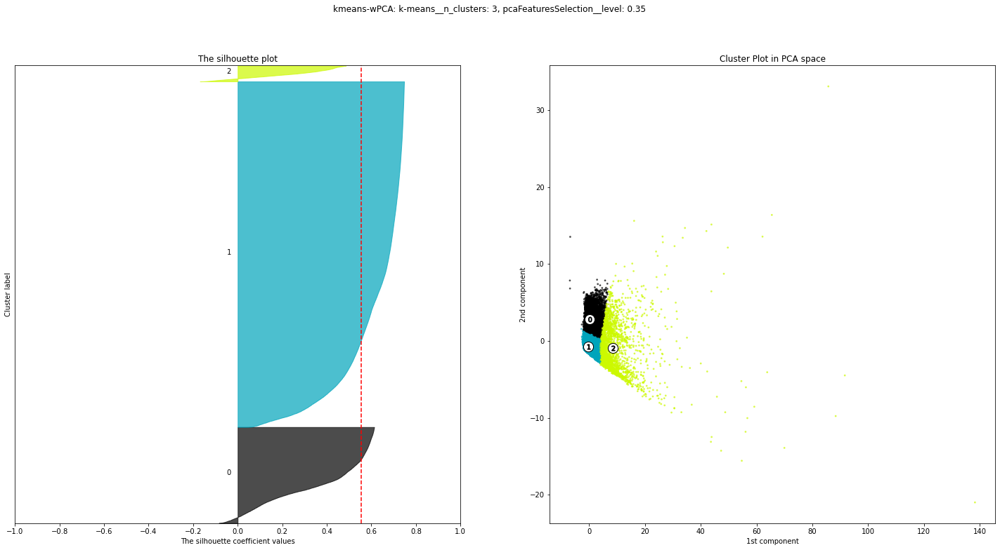

====>
Clusters population for kmeans-wPCA: k-means__n_clusters: 3, pcaFeaturesSelection__level: 0.5


,0,1,2
0,3289,70534,19526


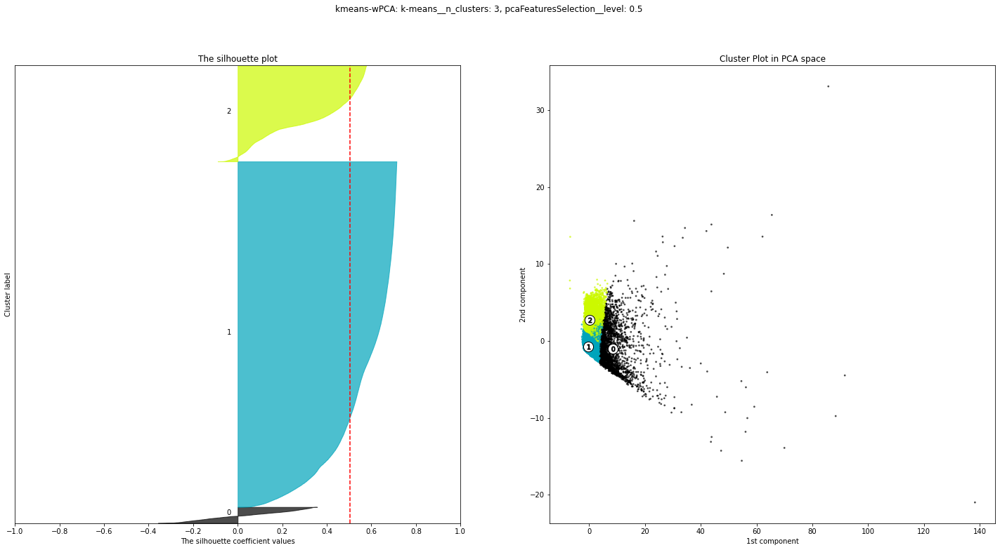

====>
Clusters population for kmeans-wPCA: k-means__n_clusters: 3, pcaFeaturesSelection__level: 0.6


,0,1,2
0,70632,19440,3277


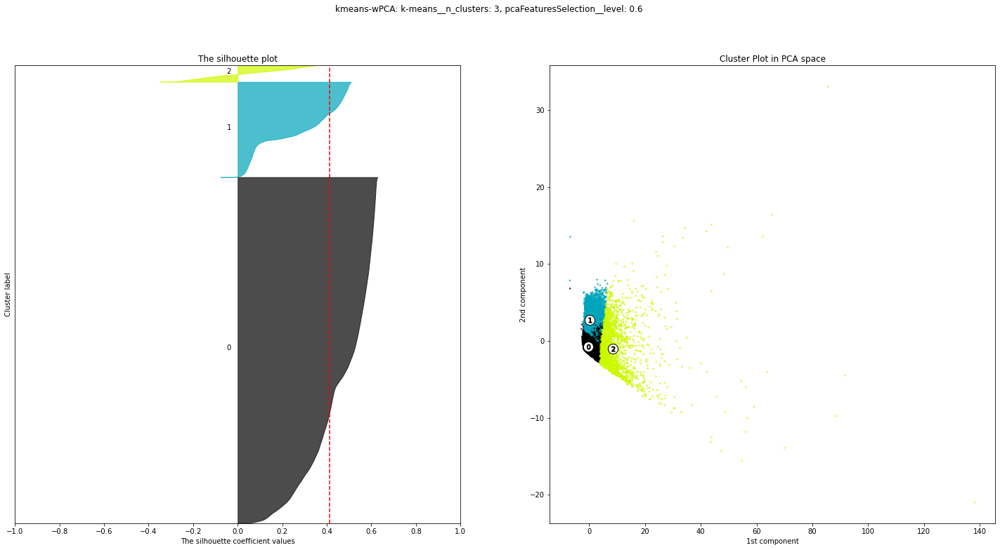

====>
Clusters population for kmeans-wPCA: k-means__n_clusters: 3, pcaFeaturesSelection__level: 0.65


,0,1,2
0,3206,70706,19437


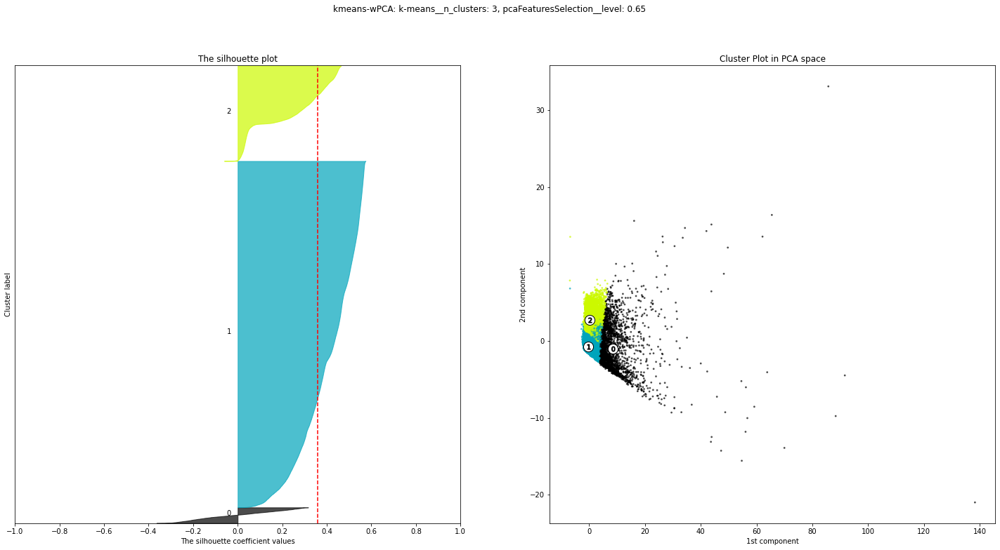

Exception for kmeans-wPCA (params: {'memory': None, 'steps': [('FS', <__main__.RuleSelection object at 0x7f439a653910>), ('SC', <__main__.FeaturesScaler object at 0x7f439a6538b0>), ('pcaFeaturesSelection', <__main__.PCAFeaturesSelection object at 0x7f439a653370>), ('k-means', KMeans(algorithm='full', max_iter=500, n_clusters=4, n_init=30))], 'verbose': False, 'FS': <__main__.RuleSelection object at 0x7f439a653910>, 'SC': <__main__.FeaturesScaler object at 0x7f439a6538b0>, 'pcaFeaturesSelection': <__main__.PCAFeaturesSelection object at 0x7f439a653370>, 'k-means': KMeans(algorithm='full', max_iter=500, n_clusters=4, n_init=30), 'k-means__algorithm': 'full', 'k-means__copy_x': True, 'k-means__init': 'k-means++', 'k-means__max_iter': 500, 'k-means__n_clusters': 4, 'k-means__n_init': 30, 'k-means__random_state': None, 'k-means__tol': 0.0001, 'k-means__verbose': 0, 'pcaFeaturesSelection__level': 0.2}): exception (Found array with 0 feature(s) (shape=(93349, 0)) while a minimum of 1 is requi

,0,1,2,3
0,67279,18609,488,6973


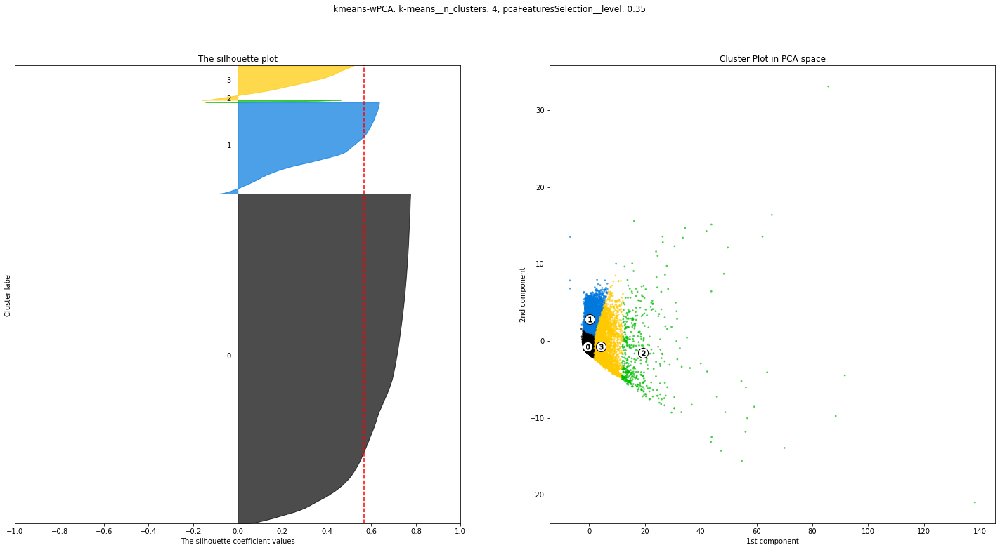

====>
Clusters population for kmeans-wPCA: k-means__n_clusters: 4, pcaFeaturesSelection__level: 0.5


,0,1,2,3
0,69390,19302,4515,142


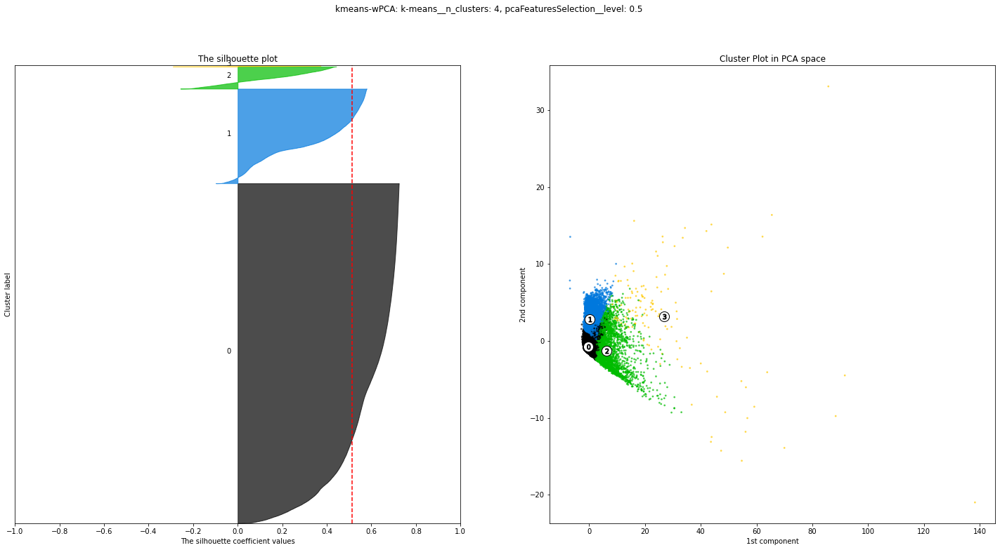

====>
Clusters population for kmeans-wPCA: k-means__n_clusters: 4, pcaFeaturesSelection__level: 0.6


,0,1,2,3
0,63480,17638,9413,2818


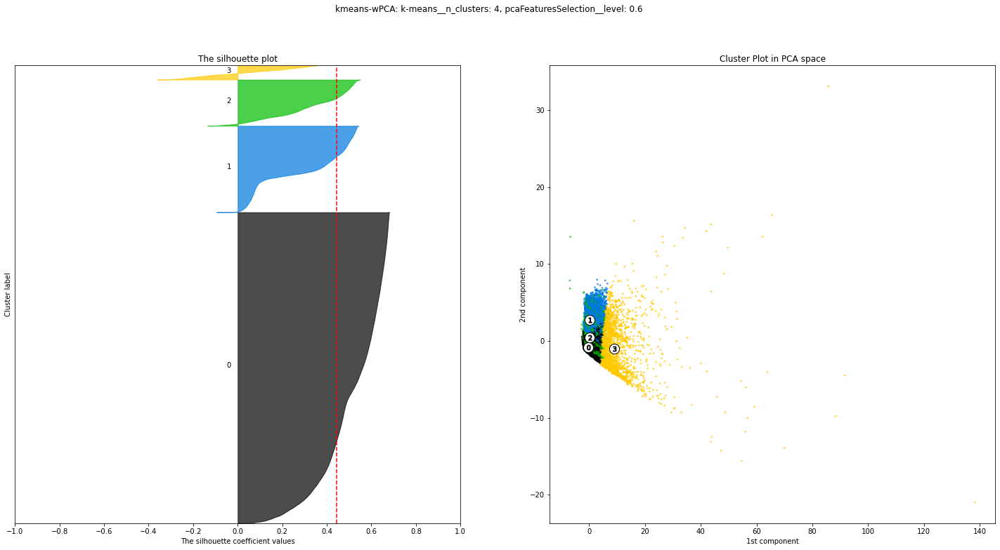

====>
Clusters population for kmeans-wPCA: k-means__n_clusters: 4, pcaFeaturesSelection__level: 0.65


,0,1,2,3
0,63529,17624,9429,2767


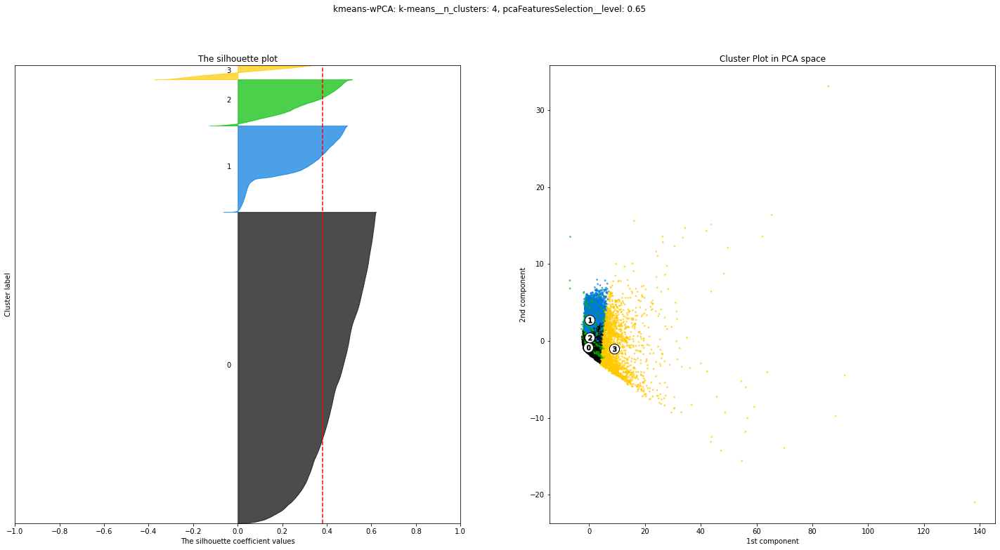

Exception for kmeans-wPCA (params: {'memory': None, 'steps': [('FS', <__main__.RuleSelection object at 0x7f439a653910>), ('SC', <__main__.FeaturesScaler object at 0x7f439a6538b0>), ('pcaFeaturesSelection', <__main__.PCAFeaturesSelection object at 0x7f439a653370>), ('k-means', KMeans(algorithm='full', max_iter=500, n_clusters=5, n_init=30))], 'verbose': False, 'FS': <__main__.RuleSelection object at 0x7f439a653910>, 'SC': <__main__.FeaturesScaler object at 0x7f439a6538b0>, 'pcaFeaturesSelection': <__main__.PCAFeaturesSelection object at 0x7f439a653370>, 'k-means': KMeans(algorithm='full', max_iter=500, n_clusters=5, n_init=30), 'k-means__algorithm': 'full', 'k-means__copy_x': True, 'k-means__init': 'k-means++', 'k-means__max_iter': 500, 'k-means__n_clusters': 5, 'k-means__n_init': 30, 'k-means__random_state': None, 'k-means__tol': 0.0001, 'k-means__verbose': 0, 'pcaFeaturesSelection__level': 0.2}): exception (Found array with 0 feature(s) (shape=(93349, 0)) while a minimum of 1 is requi

,0,1,2,3,4
0,66410,1475,34,14264,11166


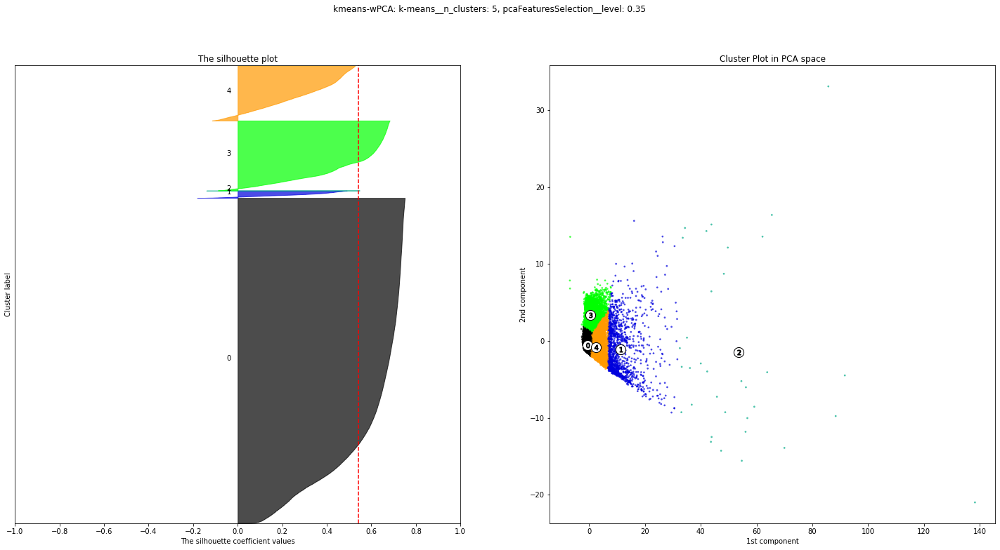

====>
Clusters population for kmeans-wPCA: k-means__n_clusters: 5, pcaFeaturesSelection__level: 0.5


,0,1,2,3,4
0,18555,4320,3428,66927,119


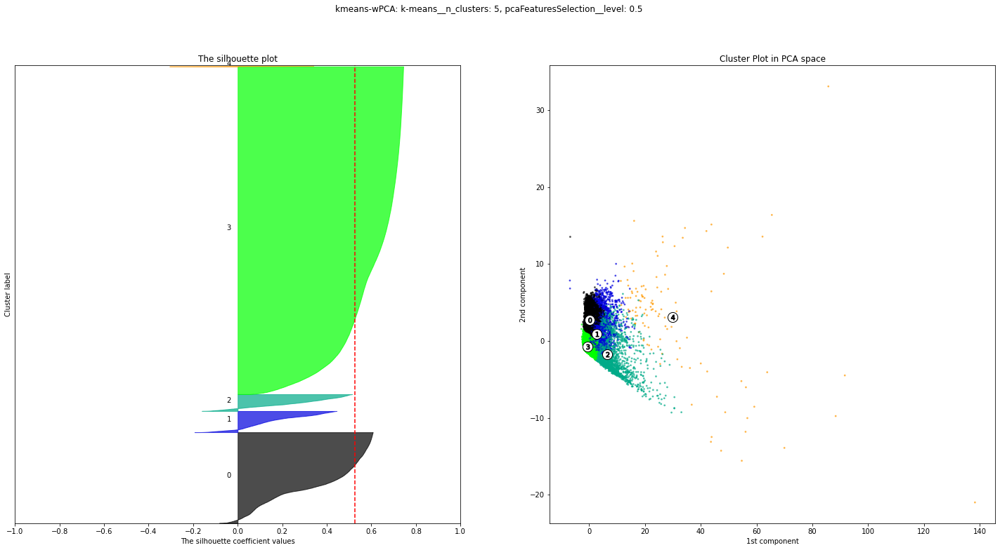

====>
Clusters population for kmeans-wPCA: k-means__n_clusters: 5, pcaFeaturesSelection__level: 0.6


,0,1,2,3,4
0,17452,62587,3905,9263,142


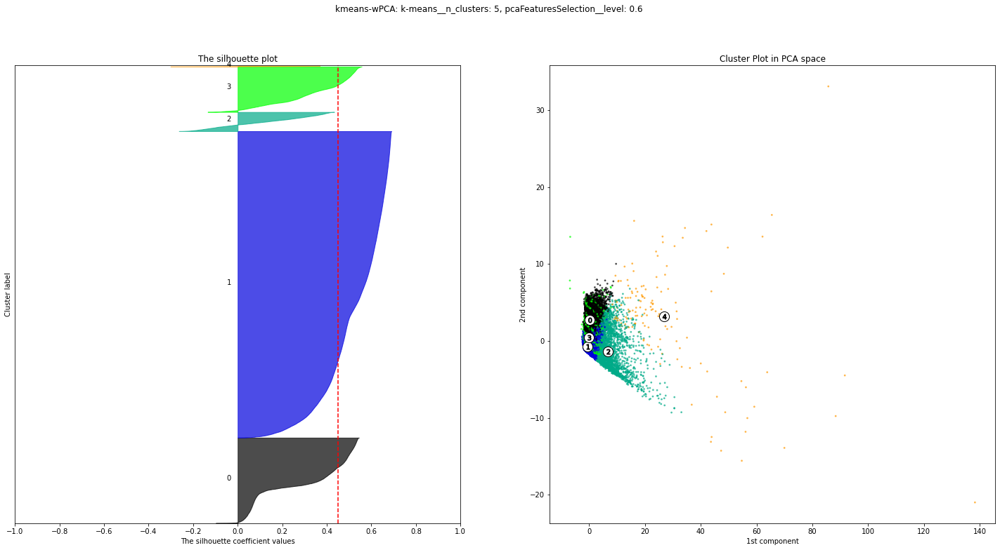

====>
Clusters population for kmeans-wPCA: k-means__n_clusters: 5, pcaFeaturesSelection__level: 0.65


,0,1,2,3,4
0,3874,9263,62626,17447,139


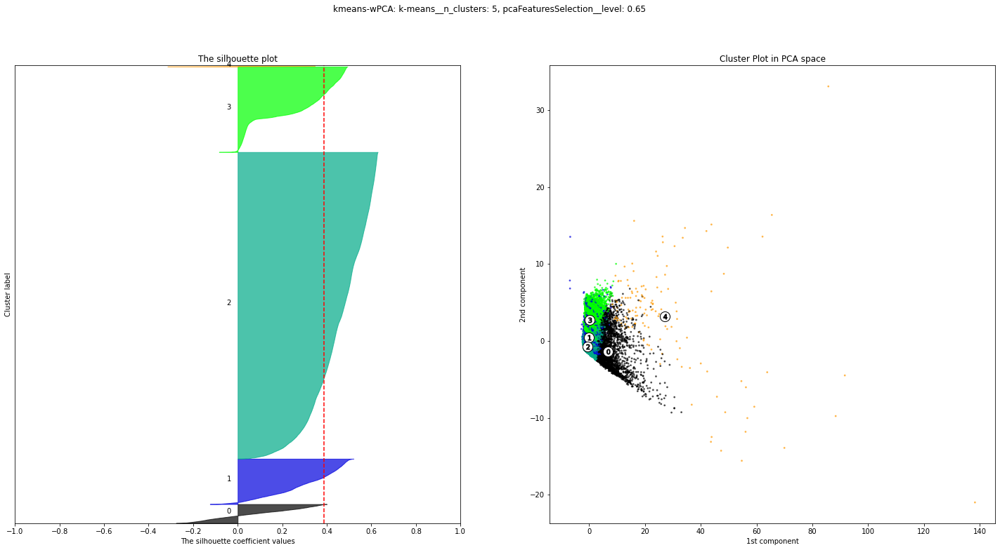

Exception for kmeans-wPCA (params: {'memory': None, 'steps': [('FS', <__main__.RuleSelection object at 0x7f439a653910>), ('SC', <__main__.FeaturesScaler object at 0x7f439a6538b0>), ('pcaFeaturesSelection', <__main__.PCAFeaturesSelection object at 0x7f439a653370>), ('k-means', KMeans(algorithm='full', max_iter=500, n_clusters=6, n_init=30))], 'verbose': False, 'FS': <__main__.RuleSelection object at 0x7f439a653910>, 'SC': <__main__.FeaturesScaler object at 0x7f439a6538b0>, 'pcaFeaturesSelection': <__main__.PCAFeaturesSelection object at 0x7f439a653370>, 'k-means': KMeans(algorithm='full', max_iter=500, n_clusters=6, n_init=30), 'k-means__algorithm': 'full', 'k-means__copy_x': True, 'k-means__init': 'k-means++', 'k-means__max_iter': 500, 'k-means__n_clusters': 6, 'k-means__n_init': 30, 'k-means__random_state': None, 'k-means__tol': 0.0001, 'k-means__verbose': 0, 'pcaFeaturesSelection__level': 0.2}): exception (Found array with 0 feature(s) (shape=(93349, 0)) while a minimum of 1 is requi

,0,1,2,3,4,5
0,8093,47660,24237,949,28,12382


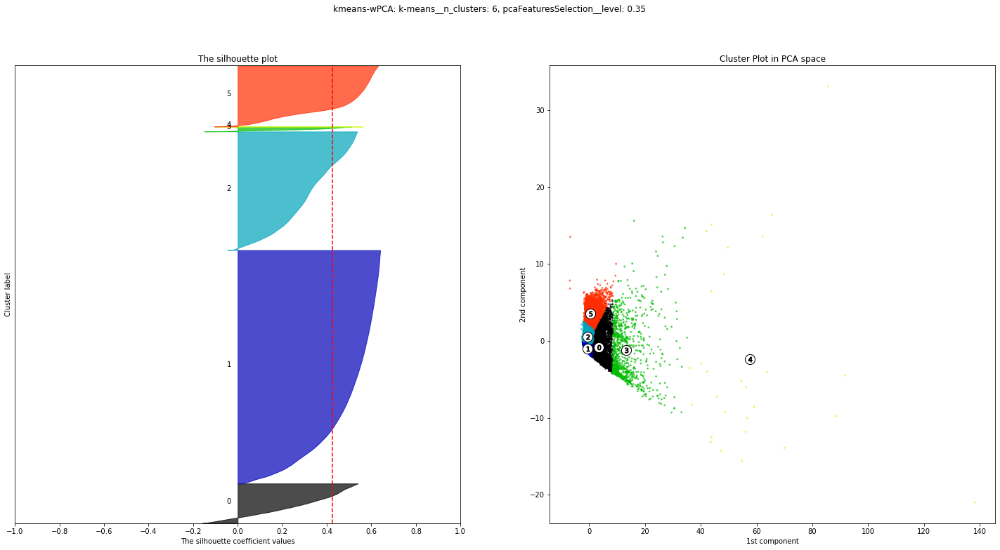

====>
Clusters population for kmeans-wPCA: k-means__n_clusters: 6, pcaFeaturesSelection__level: 0.5


,0,1,2,3,4,5
0,17727,10452,4177,92,1288,59613


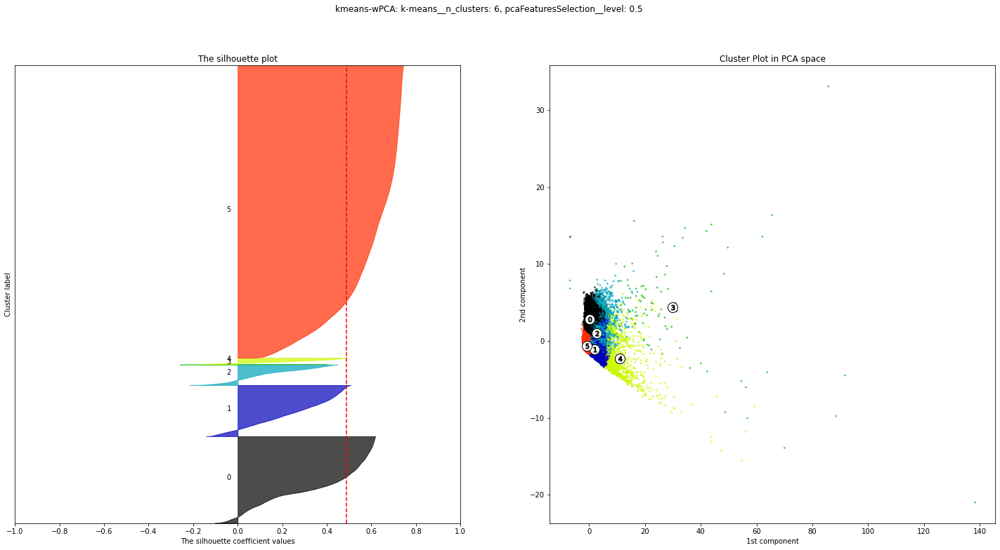

====>
Clusters population for kmeans-wPCA: k-means__n_clusters: 6, pcaFeaturesSelection__level: 0.6


,0,1,2,3,4,5
0,60365,16799,9114,2974,3982,115


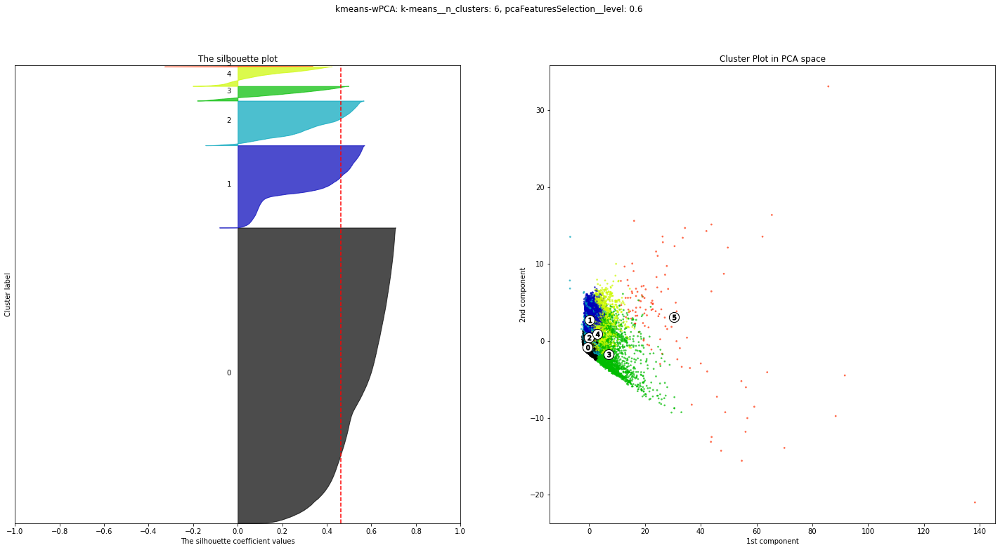

====>
Clusters population for kmeans-wPCA: k-means__n_clusters: 6, pcaFeaturesSelection__level: 0.65


,0,1,2,3,4,5
0,4139,9120,112,2832,60360,16786


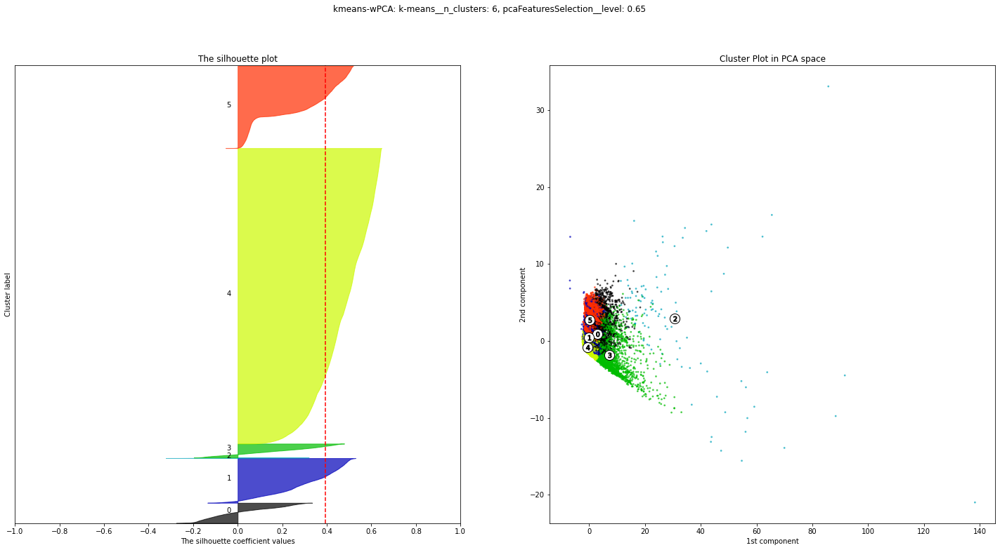

In [9]:
high_correlated = ['nb_voucher','nb_credit_card','nb_orders','nb_items_order_avg', 'nb_boleto','payment_installments_max','payment_sequential_max','amount_last_order']
low_correlated  = ['distance','volume_max','weight_max','nb_orders_canceled','nb_days_since_last_order','review_score_avg','r_freight_price_max','order_value_stddev','nb_debit_card']

config = {
            'RFM-kmeans':{
                'pipe':  Pipeline([("featuresSelection",FeaturesSelection(['nb_days_since_last_order','nb_orders','amount_last_order'])),("k-means",KMeans())]),
                'params':{'k-means__n_clusters':range(2,11),'k-means__algorithm':['full'],'k-means__max_iter':[500],'k-means__n_init':[30]},
                'fitted_params':['k-means__n_clusters']
            },
            'RFM-DBSCAN':{
                'pipe':  Pipeline([("featuresSelection",FeaturesSelection(['nb_days_since_last_order','nb_orders','amount_last_order'])),("stdScaler",StandardScaler()),("dbscan",DBSCAN())]),
                'params':{'dbscan__eps':[0.1,0.2,0.5],'dbscan__min_samples':[5,10,50],'dbscan__n_jobs':[-1]},
                'fitted_params':['dbscan__eps','dbscan__min_samples']
            },
            'kmeans':{
                'pipe':  Pipeline([("FS",RuleSelection(rule=lambda X: list(X.select_dtypes('number').columns.values))),("SC",FeaturesScaler(scaler=StandardScaler())),
                                   ("pcaFeaturesSelection",PCAFeaturesSelection()),("k-means",KMeans())]),
                'params':{'k-means__n_clusters':range(2,7),'k-means__algorithm':['full'],'k-means__max_iter':[500],'k-means__n_init':[30],'pcaFeaturesSelection__level':[0.75,0.8,0.85,0.9] },
                'fitted_params':['k-means__n_clusters','pcaFeaturesSelection__level']
            },
            'kmeans1':{
                'pipe':  Pipeline([ ("FS",FeaturesSelection(['nb_days_since_last_order','nb_orders','amount_last_order'])) ,("k-means",KMeans())]),
                'params':{'k-means__n_clusters':[3,4,5] },
                'fitted_params':['k-means__n_clusters']
            },
            'kmeans2':{
                'pipe':  Pipeline([("FS",FeaturesSelection(['nb_boleto','nb_credit_card','order_value_avg','nb_items_order_avg','review_score_avg'])),("k-means",KMeans())]),
                'params':{'k-means__n_clusters':[3,4,5] },
                'fitted_params':['k-means__n_clusters']
            },
            'kmeans3':{
                'pipe':  Pipeline([("FS",FeaturesSelection(['nb_boleto','nb_credit_card','order_value_avg','nb_items_order_avg','review_score_avg','payment_installments_max'])),("k-means",KMeans())]),
                'params':{'k-means__n_clusters':[3,4,5] },
                'fitted_params':['k-means__n_clusters']
            },
            'kmeans4':{
                'pipe':  Pipeline([("FS",FeaturesSelection(['nb_boleto','nb_credit_card','order_value_avg','nb_items_order_avg','review_score_avg','r_freight_price_max'])),("k-means",KMeans())]),
                'params':{'k-means__n_clusters':[3,4,5] },
                'fitted_params':['k-means__n_clusters']
            },
            'highc-kmeans':{
                'pipe':  Pipeline([("featuresSelection",FeaturesSelection(high_correlated )),("k-means",KMeans())]),
                'params':{
                    'k-means__n_clusters':range(3,5),'k-means__algorithm':['full'],'k-means__max_iter':[300],'k-means__n_init':[10]
                
                },
                'fitted_params':['k-means__n_clusters']
            },
            'lowc-kmeans':{
                'pipe':  Pipeline([("featuresSelection",FeaturesSelection(low_correlated )),("k-means",KMeans())]),
                'params':{
                    'k-means__n_clusters':range(3,5),'k-means__algorithm':['full'],'k-means__max_iter':[300],'k-means__n_init':[10]
                
                },
                'fitted_params':['k-means__n_clusters']
            },
            'kmeans5':{
                'pipe':  Pipeline([
                    ("FS",FeaturesSelection()),
                    ("L",LambdaFeatures(f=Log_plus1(),features=['order_value_avg','volume_max','weight_max','r_freight_price_max'])),
                    ("SC",FeaturesScaler()),
                    ("kM",KMeans())
                ]),
                'params':{
                    'kM__n_clusters':[3,4,5],'kM__algorithm':['full'],'kM__max_iter':[500],'kM__n_init':[30],
                    'FS__features':[
                        ['order_value_avg','review_score_avg','volume_max'],
                        ['order_value_avg','review_score_avg','volume_max','r_freight_price_max'],
                        ['order_value_avg','review_score_avg','weight_max','r_freight_price_max'],
                        ['order_value_avg','review_score_avg','volume_max','weight_max','r_freight_price_max'],
                        ['order_value_avg','review_score_avg','volume_max','weight_max','distance'],                        
                        ['order_value_avg','review_score_avg','volume_max','payment_installments_max','nb_credit_card'],                                                
                        ['order_value_avg','review_score_avg','volume_max','weight_max','r_freight_price_max','payment_installments_max','nb_credit_card','distance']
                    ],
                    "SC__scaler":[RobustScaler()],
                },
                'fitted_params':['kM__n_clusters','FS__features']
            },
            'kmeans-wPCA':{
                'pipe':  Pipeline([("FS",RuleSelection(rule=lambda X: list(X.select_dtypes('number').columns.values))),("SC",FeaturesScaler(scaler=StandardScaler())),
                                   ("pcaFeaturesSelection",PCAFeaturesSelection()),("k-means",KMeans())]),
                'params':{'k-means__n_clusters':range(2,7),'k-means__algorithm':['full'],'k-means__max_iter':[500],'k-means__n_init':[30],'pcaFeaturesSelection__level':[0.20,0.35,0.50,0.6,0.65] },
                'fitted_params':['k-means__n_clusters','pcaFeaturesSelection__level']
            },        
}

results = do_clustering(config,data)


Modèle final

====>
Clusters population for final: kM__n_clusters: 4, FS__features: ['order_value_avg', 'review_score_avg', 'volume_max']


,0,1,2,3
0,30743,19539,30649,12418


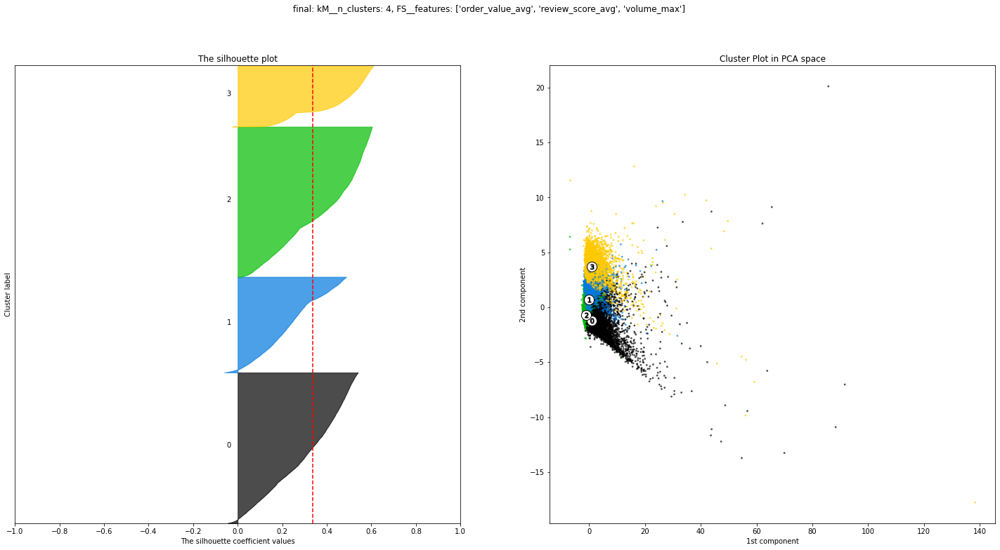

In [7]:
config = {
        'final':{
            'pipe':  Pipeline([
                ("FS",FeaturesSelection()),
                ("L",LambdaFeatures(f=Log_plus1(),features=['order_value_avg','volume_max'])),
                ("SC",FeaturesScaler()),
                ("kM",KMeans())
            ]),
            'params':{
                'kM__n_clusters':[4],'kM__algorithm':['full'],'kM__max_iter':[500],'kM__n_init':[30],
                'FS__features':[
                    ['order_value_avg','review_score_avg','volume_max']
                ],
                "SC__scaler":[RobustScaler()],
            },
            'fitted_params':['kM__n_clusters','FS__features']
        }
}

final_results = do_clustering(config,data)

# get model
# joblib.dump(pipe,f'./results/model.sav')

Stabilité des clusters

In [39]:
from sklearn.metrics import adjusted_rand_score

# cluster ref
ref_clusters = final_results.__raw_res__['final'][0]['cluster_labels']
#pipe
params = final_results.__raw_res__['final'][0]['params']
steps = params['steps'] 
pipe = Pipeline(steps).set_params(**params)

def cluster_stability(pipe,ref,X,n):
    return np.array(
        list( map(lambda _ : adjusted_rand_score(ref,pipe.fit_predict(X)), range(n)) )
    ).mean()

n = 10
print(f"Score ARI moyen après {n} clustering: {cluster_stability(pipe=pipe,ref=ref_clusters,X=data,n=n)}")


Score ARI moyen après 10 clustering: 0.5830977844030624 


Sauvegarde résultats

In [8]:
data['cluster'] = final_results.__raw_res__['final'][0]['cluster_labels']
data.to_csv(f'./data/dfs/results/results.csv')